Welcome to the **Explainer Notebook for Project Assigment B** in the class [02805 Social Graphs and Interactions](https://kurser.dtu.dk/course/02805) offered by DTU in the Fall 2020. You can also have a look at our: 

[Github](https://github.com/s153748/s153748.github.io) | [Webpage](https://s153748.github.io/) | [Video](https://www.youtube.com/watch?v=wJykfm2wims&ab_channel=LiseStyve)

We follow a general outline covering the [required deliverables](https://github.com/SocialComplexityLab/socialgraphs2020/wiki/Project-Assignments#project-assignment-b):
1. Motivation
    * Purpose
    * Dataset
2. Basic stats
    * Data preprocessing and cleaning
    * Exploratory data analysis
3. Tools, theory and analysis
    * Network analysis
    * Spacio-temporal analysis
    * Community analysis
4. Discussion
5. Contributions

# 1 Motivation
<font color='teal'>*Description of dataset and why we chose it, goal for the end user's experience*

*Purpose*

GitHub is where over 50 million developers shape the future of software, together. The site provides hosting for software development, version control using Git and several collaboration features. As of January 2020, GitHub reports having over 40 million users and more than 190 million repositories (including at least 28 million public repositories), making it the largest host of source code in the world [[1]](https://en.wikipedia.org/wiki/GitHub).

The aim of our project is to analyze the social network of GitHub users. We limit our focus to profiles related to the topic of machine learning, which has huge potential and untapped possibilities [[2]](https://www.forbes.com/sites/forbestechcouncil/2020/03/24/machine-learning-the-real-buzzword-of-2020/?sh=1fb640c13ea7). We will analyze the network with the purpose of answering the main questions:
1. How are the users connected?
    - Centrality, connectivity, hubs, communities and spatial connections in the network
2. What are the most popular languages?
    - Bar charts, trend over time, wordclouds for network and communities
3. How is the vibe in the coding communities?
    - Sentiment analysis of user bios and repository descriptions
4. What users are worth following?
    - Based on followers, repository stars and forks, and vibe in communities

Finally, we will present our findings from the network and text analysis using interactive visualizations hosted on a [GitHub webpage](https://s153748.github.io/). The goal for the end user experience is to provide an overview of the Github network and its characteristics though answerering the above questions. Further, we want the user to be able to explore the graph of the network and its communities in different ways in order to learn more about the top machine learning developers and be inspired. 

*Dataset*

When we first searched for machine learning on GitHub, it resulted in 277,787 repositories, 9,588,021 available codes, 258,336 commits, 110,957 issues, 47,434 users and 31,396 wikis. So there is more than enough data to work with. We decide to scrape data from the owners as well as the top contributers of the top repositories matching our search.

In order to gather data from the GitHub API, we generate a [GitHub access token](https://docs.github.com/en/free-pro-team@latest/github/authenticating-to-github/creating-a-personal-access-token) and use the tools `PyGithub`, `Requests` and `Beautiful Soup`. The scraping results in a 297.2+ KB dataset of 1585 distinct users as rows and 23 data variables as columns. The data variables obtained from the user profiles are:
* `user_name` - user name
* `name` - full name
* `bio` - biography
* `email` - email 
* `location` - location
* `company` - company
* `hireable` - whether the user is hireable or not (true/false)
* `blog` - blog url
* `created_at` - date and time the user was created
* `updated_at` - date and time the user was updated
* `followers_count` - number of followers
* `following_count` - number of users the user is following

Further, the variabels obtained from the user’s repositories are:
* `repos` - name of repository the user is extracted from
* `owner` - name of the owner of the repository the user is extracted from
* `description` - of repository the user is extracted from
* `repos_count` - number of repositories per user
* `repos_name` - name of all repositories per user
* `total_stars` - count of stars of repositories per user
* `total_forks` - count of forks of repositories per user
* `main_language` - the language used the most in the user's repositories
* `used_languages` - all languages used in the user's repositories

The dataset is available for [download](https://github.com/s153748/s153748.github.io).

# 2. Basic stats
<font color='teal'>*Understand dataset better, choices in data cleaning and preprocessing, discuss the dataset stats (recycle the work for Project Assignment A)*

## 2.1 Data preprocessing and cleaning
In the following we will describe how we aquire the data through data scraping of the GitHub API and how we preparee and clean the data prior to the exploratory analysis.

### 2.1.1 Imports
The relevant libraries and packages are loaded below.

In [1]:
import pandas as pd
import numpy as np
from urllib.request import urlopen
import requests
import re
import ast 
from bs4 import BeautifulSoup
import json
import os
import string  
import math
import random
import matplotlib.pyplot as plt
from jupyterthemes import jtplot
import seaborn as sns
from seaborn import color_palette
import networkx as nx
import community
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.probability import FreqDist
from wordcloud import WordCloud, ImageColorGenerator
from fa2 import ForceAtlas2
from PIL import Image, ImageFont
import collections
import plotly.express as px 
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from ipywidgets import widgets
from googletrans import Translator
import altair as alt 
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
from tqdm import tqdm
import folium
from folium import FeatureGroup, LayerControl, plugins, Map, Marker
from folium.plugins import FastMarkerCluster, MarkerCluster
import warnings
warnings.filterwarnings('ignore')

### 2.1.2 Data scraping 
*Note that this section should not be run, as it takes a long time.*

### 2.1.3 Load data

In [2]:
# define missing value types
missing_values = ['na', 'n/a', '-', '--']

# load scraped data
df = pd.read_csv('data/final_data.csv', converters={'following': eval,'repos_name': eval}, index_col=0, na_values = missing_values)

# display dataframe
df.head(3)

,user_name,owner,repos,name,type,company,location,bio,created_at,updated_at,...,email,followers_count,following_count,hireable,repos_count,repos_name,total_stars,total_forks,main_language,used_languages
0,josephmisiti,josephmisiti,awesome-machine-learning,Joseph Misiti,User,Math & Pencil,"Brooklyn, NY",Mathematician & Co-founder of Math & Pencil,2010-04-17T21:09:13Z,2020-10-29T18:11:39Z,...,NaN,2610,275,True,226,"[80s.nyc, alexa-skills-kit-js, algodeck, algor...",48727,12605,Python,['C' 'C++' 'CSS' 'CoffeeScript' 'Go' 'HTML' 'J...
1,wepe,wepe,MachineLearning,wepon,User,AntFin,China Hangzhou,NaN,2014-10-10T14:28:18Z,2020-11-05T15:54:10Z,...,wepon@pku.edu.cn,4564,47,NaN,27,"[AliTianChi, CaiNiao-DemandForecast-StoragePla...",7324,5193,Python,['C++' 'HTML' 'Java' 'Python' 'Shell']
2,ZuzooVn,ZuzooVn,machine-learning-for-software-engineers,Nam Vu,User,NaN,Vietnam,A Vietnamese Software Engineer who is really p...,2012-02-11T16:55:02Z,2020-10-12T02:40:45Z,...,zuzoovn@gmail.com,1223,91,True,38,"[android-classyshark, asi-http-request, awesom...",24471,5838,Python,['C' 'DIGITAL Command Language' 'HTML' 'Java' ...


In [3]:
# get info such as shape, data types, column names, memory usage
print(df.shape)
df.info()

(1585, 23)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1585 entries, 0 to 1584
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   user_name        1585 non-null   object
 1   owner            1585 non-null   object
 2   repos            1585 non-null   object
 3   name             1345 non-null   object
 4   type             1585 non-null   object
 5   company          767 non-null    object
 6   location         1008 non-null   object
 7   bio              691 non-null    object
 8   created_at       1585 non-null   object
 9   updated_at       1585 non-null   object
 10  following        1585 non-null   object
 11  description      1542 non-null   object
 12  blog             752 non-null    object
 13  email            620 non-null    object
 14  followers_count  1585 non-null   int64 
 15  following_count  1585 non-null   int64 
 16  hireable         364 non-null    object
 17  repos_count      1585 

In [4]:
# convert the used_languages to a list of strings
df['used_languages'] = df['used_languages'].str.replace(' ',',').str.replace('\n','').str.replace("'","")
def stringToList(colname):
    df[colname] = [df[colname][i][1:len(df[colname][i])-1].split(',') for i in range(len(df))]
stringToList('used_languages')

# create additional variable for 'following' with only the users that exist in the 'user_name' variable already
df['following_relevant'] = ''
for i in range(len(df)):
    df['following_relevant'][i] = np.unique([link for link in df['following'][i] if link in df['user_name'].values])

In [5]:
# select numeric columns
df_numeric = df.select_dtypes(include=[np.number])
numeric_cols = df_numeric.columns.values
print(f'Numeric variables:\n {numeric_cols}')

# select non numeric columns
df_non_numeric = df.select_dtypes(exclude=[np.number])
non_numeric_cols = df_non_numeric.columns.values
print(f'Non-numeric variables:\n {non_numeric_cols}')

Numeric variables:
 ['followers_count' 'following_count' 'repos_count' 'total_stars'
 'total_forks']
Non-numeric variables:
 ['user_name' 'owner' 'repos' 'name' 'type' 'company' 'location' 'bio'
 'created_at' 'updated_at' 'following' 'description' 'blog' 'email'
 'hireable' 'repos_name' 'main_language' 'used_languages'
 'following_relevant']


### 2.1.4 Missing data

In [6]:
# find numbers and percentages of missing data
print(f'Total number of missing values: {df.isnull().sum().sum()}\n')

print('Number and percentage of missing values per variable:')
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())*100
    if pct_missing > 0:
        print(f'{col}: {df[col].isnull().sum()} - {np.round(pct_missing,2)} %')

Total number of missing values: 5647

Number and percentage of missing values per variable:
name: 240 - 15.14 %
company: 818 - 51.61 %
location: 577 - 36.4 %
bio: 894 - 56.4 %
description: 43 - 2.71 %
blog: 833 - 52.56 %
email: 965 - 60.88 %
hireable: 1221 - 77.03 %
main_language: 56 - 3.53 %


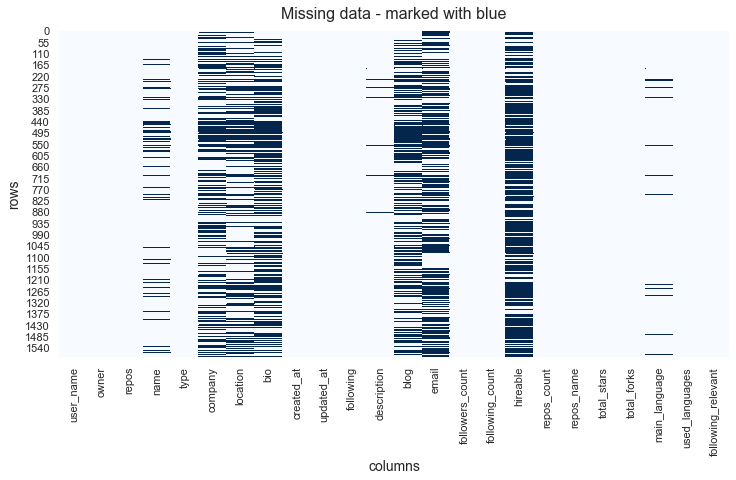

In [7]:
# define colors for plotting
blue = ['#f7fbff','#79b8ff','#0366d6','#044289','#05264c','#191970']

# visualize the missing data with a heatmap
sns.set()
plt.figure(figsize=(12, 6))
heatmap = sns.heatmap(df[df.columns].isnull(), cmap=sns.color_palette([blue[0], blue[4]]),cbar=False)
heatmap.set_title('Missing data - marked with blue', fontsize=16, pad=12)
heatmap.set_xlabel('columns',fontsize=14)
heatmap.set_ylabel('rows',fontsize=14)
plt.show()

The percentages of missing data and the heatmap demonstrates the missing data patterns of the 24 variables. The dark blue color represents the missing data, as opposed to the light blue color representing data that is not missing. It is seen that the variables `name`, `company`, `location`, `bio`, `blog`, `email` and `hirable` have missing values throughout many rows, whereas `description` and `main_language` only has a few missing values. There seem to be no missing values for the numeric variables. We notice that the `hireable` variable has as much as 77 % of missing data indicating we should remove this variable.

In [8]:
# drop variables with a lot of missing data
df = df.drop('hireable', axis=1)

# update
df_non_numeric = df.select_dtypes(exclude=[np.number])
non_numeric_cols = df_non_numeric.columns.values

We now identify the missing values situations among the 1585 observations.

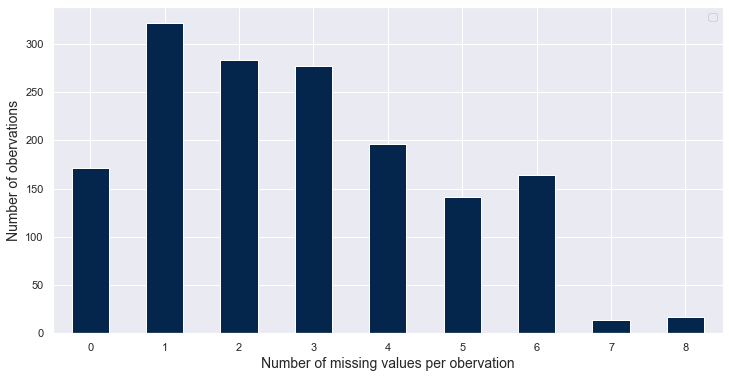

In [9]:
# first create missing indicator for variables with missing data
for col in df.columns:
    missing = df[col].isnull()
    num_missing = np.sum(missing)
    if num_missing > 0:  
        df['{}_ismissing'.format(col)] = missing

# based on the indicator, plot the bar chart of missing values
ismissing_cols = [col for col in df.columns if 'ismissing' in col]
df['num_missing'] = df[ismissing_cols].sum(axis=1)
sns.set()
df['num_missing'].value_counts().reset_index().sort_values(by='index').plot.bar(
    x='index', y='num_missing', figsize=(12, 6), color=blue[4])
plt.xticks(rotation=0)
plt.xlabel('Number of missing values per obervation',fontsize=14)
plt.ylabel('Number of obervations',fontsize=14)
plt.legend('')
plt.show()

It is seen that there are about 175 observations with no missing values, over 300 observations with one missing values and so on. We decide not to remove any of the observations, since none of them have more than 8 missing values (out of 24), which means there are still a lot of useful data from the remaining values that are not missing.

To handle the missing data of the categorical values, we have different options:
* Drop the missing values
* Replace missing values with the mode (the most frequent value) of the data that is not missing
* Fill missing values with empty strings "" indicating the data is missing

Since we don't want to want to keep as much information as possible while not "manipulating" the results, we choose the last option.  

In [10]:
for col in non_numeric_cols:
    missing = df[col].isnull()
    num_missing = np.sum(missing)
    if num_missing > 0:
        print('Filling missing values for: {}'.format(col))
        df['{}_ismissing'.format(col)] = missing
        df[col] = df[col].fillna('')

Filling missing values for: name
Filling missing values for: company
Filling missing values for: location
Filling missing values for: bio
Filling missing values for: description
Filling missing values for: blog
Filling missing values for: email
Filling missing values for: main_language


In [11]:
# drop columns used to detect missing values
df = df.drop(ismissing_cols, axis=1)
df = df.drop('num_missing', axis=1)

# update
df_non_numeric = df.select_dtypes(exclude=[np.number])
non_numeric_cols = df_non_numeric.columns.values

# any missing values?
if df.isnull().values.any() == False:
    print('No more missing values')

No more missing values


### 2.1.5 Unnecessary data
The aim is now to find unnecessary data that does not add value because it is uninformative, duplicate, repetitive or irrelevant.

In [12]:
# check for duplicates
try: 
    df.drop('user_name', axis=1).drop_duplicates()
except:
    print('No duplicates found')

No duplicates found


In [13]:
repetitive_cols = []
print('Percentage of the same value per variable:\n')
for col in df.columns:
    repetitive = (df[col].value_counts()/len(df.index)).iloc[0]
    print('{0}: {1:.1f}%'.format(col, repetitive*100))
    if repetitive > 0.5:
        repetitive_cols.append(col)

Percentage of the same value per variable:

user_name: 0.1%
owner: 10.0%
repos: 6.3%
name: 15.1%
type: 100.0%
company: 51.6%
location: 36.4%
bio: 56.4%
created_at: 0.1%
updated_at: 0.1%
following: 31.2%
description: 2.7%
blog: 52.6%
email: 60.9%
followers_count: 9.9%
following_count: 31.2%
repos_count: 3.4%
repos_name: 2.1%
total_stars: 25.6%
total_forks: 28.6%
main_language: 42.1%
used_languages: 3.5%
following_relevant: 1.1%


In [14]:
print('Top values of the most repetitive variables:')
for col in repetitive_cols:
    display(df[col].value_counts()[:5])

Top values of the most repetitive variables:


User    1585
Name: type, dtype: int64

              818
Microsoft      57
Google         36
Amazon         14
@Microsoft     13
Name: company, dtype: int64

                             894
Software Engineer              4
Data Scientist                 4
Machine Learning Engineer      2
Google Brain                   2
Name: bio, dtype: int64

                            833
http://www.microsoft.com      2
http://viralfsharp.com        2
https://aws.amazon.com/       2
https://aws.amazon.com        2
Name: blog, dtype: int64

                               965
luca.antiga@orobix.com           1
vincentg@unity3d.com             1
rozentill@gmail.com              1
zivkovic.nikola87@gmail.com      1
Name: email, dtype: int64

The variable `type` has only one distinct value, that is user, and is thus 100 % repetitive. Since all observations have the same type, this variable does not contribute with any value and can be removed from the dataset. 

For the other repetitive variables, a lot of values that are blank representing the information was not provided. For example, `email` has 60.9 % of its values as blank, meaning the email was not provided by the GitHub user, whereas the rest of the values are unique emails. Since the values of the variables are not very repetitive besides from the blanks, we decide to keep them. 

In [15]:
# drop the variable 'type'
df = df.drop('type', axis=1)

# update
df_non_numeric = df.select_dtypes(exclude=[np.number])
non_numeric_cols = df_non_numeric.columns.values

### 2.1.6 Inconsistent data
Though looking at the repetitive values above, we spot that both Microsoft and @Microsoft was on the list of companies, suggesting we should remove the '@'. We expect a lot of different punctuations and have look at distinct values to detect which we want to remove, as we want to keep the '&' in the company Math & Pencil for example. 

We clean the variables `company` and `location` by removing selected punctuations, converting the text to lower case and stripping for blanks. The variables `description` and `bio` with larger amounts of text will be cleaned for the purpose of the sentiment analysis in Section 3.5. 

In [16]:
# look at unique values
#np.unique(df['company'])
#np.unique(df['location'])

def remove_punctuation(text):
    punctuation = '!"#$%\'()*+,./:;<=>?@[\\]^_`´{|}~¨°⇄·'
    no_punct = [words for words in text if words not in punctuation]
    words_wo_punct = ''.join(no_punct)
    return words_wo_punct

df['company'] = df['company'].str.lower().str.strip().apply(lambda x: remove_punctuation(x))
df['location'] = df['location'].str.lower().str.strip().apply(lambda x: remove_punctuation(x))

# remove selected non-meaningful values
inconsistent = ['0x7ffffffeffff', '127001', '14011300', 'devtcp127001443', 'vault 0 ⇌ br ⇌ es ⇌ us']
for word in inconsistent:
    df['company'] = df['company'].replace(word,'')
    df['location'] = df['location'].replace(word,'')

We make sure the format of the datetime variables are correct and create additional variables for year, month and day, that is easier to work with in the analysis. 

In [17]:
df['created_at'] = pd.to_datetime(df['created_at'], format='%Y-%m-%d')
df['created_at_year'] = df['created_at'].dt.year
df['created_at_month'] = df['created_at'].dt.month
df['created_at_weekday'] = df['created_at'].dt.weekday

df['updated_at'] = pd.to_datetime(df['updated_at'], format='%Y-%m-%d')
df['updated_at_year'] = df['updated_at'].dt.year
df['updated_at_month'] = df['updated_at'].dt.month
df['updated_at_weekday'] = df['updated_at'].dt.weekday
df.head(1)

,user_name,owner,repos,name,company,location,bio,created_at,updated_at,following,...,total_forks,main_language,used_languages,following_relevant,created_at_year,created_at_month,created_at_weekday,updated_at_year,updated_at_month,updated_at_weekday
0,josephmisiti,josephmisiti,awesome-machine-learning,Joseph Misiti,math & pencil,brooklyn ny,Mathematician & Co-founder of Math & Pencil,2010-04-17 21:09:13+00:00,2020-10-29 18:11:39+00:00,"[mojombo, defunkt, vanpelt, macournoyer, ry, b...",...,12605,Python,"[C, C++, CSS, CoffeeScript, Go, HTML, Java, Ja...","[JWarmenhoven, agramfort, alextp, amueller, ba...",2010,4,5,2020,10,3


### 2.1.7  Adding geo locations

In this part, we infer the GPS coordinates (longitude and latitude) from the `location` variable in the dataset. This will enable the creating of a graph based on geographic position of each user. 

We use the Python client for geocoding web services [GeoPy](https://geopy.readthedocs.io/en/stable/#module-geopy.extra.rate_limiter) together with the geolocator [OpenStreetMap Nominatim](https://nominatim.openstreetmap.org/ui/search.html), which allows us to look up a location's GPS coordinates from a textual description. It has its own class in `geopy.geocoders` abstracting the API.

Note that finding the geolocations takes some time due to [limitations](https://operations.osmfoundation.org/policies/nominatim/). A delay of 1 second (`min_delay_seconds`=1) is used between each pair of `geolocator.geocode` calls. 

In [18]:
# load location data
location_df = pd.read_csv('data/location_data.csv', converters={'following': eval,'repos_name': eval, "coordinates": ast.literal_eval}, index_col=0)

location_df['following_relevant_loc'] = ''
for i in range(len(location_df)):
    try:
        location_df['following_relevant_loc'][i] = np.unique([link for link in location_df['following'][i] if link in location_df['user_name'].values])
    except: 
        location_df['following_relevant_loc'][i] = []
        
# display
location_df[['location','coordinates','latitude','longitude']].head(3)

,location,coordinates,latitude,longitude
0,brooklyn ny,"(40.6501038, -73.9495823)",40.650104,-73.949582
1,china hangzhou,"(30.2489634, 120.2052342)",30.248963,120.205234
2,vietnam,"(13.2904027, 108.4265113)",13.290403,108.426511


We add a variable continent based on whether the coordinates are within the borders of selected continents of the world. The borders are found using [boxfinder](http://bboxfinder.com/).

In [19]:
location_df['continent'] = ""
for idx, row in location_df.iterrows():
    if row['latitude'] < 70 and row['latitude'] > 27 and row['longitude'] < 40 and row['longitude'] > -25 or row['location']=='perm' or row['location']=='russia stavropol':
        location_df['continent'][idx] = 'Europe'
    elif row['latitude'] < 78 and row['latitude'] > 0 and row['longitude'] < 192 and row['longitude'] > 60:
        location_df['continent'][idx] = 'Asia' 
    elif row['latitude'] < 36 and row['latitude'] > -35 and row['longitude'] < 57 and row['longitude'] > -30 or row['location']=='mauritius':
        location_df['continent'][idx] = 'Africa' 
    elif row['latitude'] < -2 and row['latitude'] > -52 and row['longitude'] < 190 and row['longitude'] > 96:
        location_df['continent'][idx] = 'Oceania'
    elif row['latitude'] < 74 and row['latitude'] > 16 and row['longitude'] < -55 and row['longitude'] > -168:
        location_df['continent'][idx] = 'North America'
    elif row['latitude'] < 32 and row['latitude'] > -66 and row['longitude'] < -7 and row['longitude'] > -132:
        location_df['continent'][idx] = 'South America'
    else:
        location_df['continent'][idx] = 'Other'
if len(location_df[location_df['continent']=='Other']['location']) == 0:
    print('All locations have been assigned a continent')

All locations have been assigned a continent


## 2.2 Exploratory data analysis
We explote the full dataset more in detail in this section. The reduced dataset with only users that has a location stated on their profiles, will be analysed in Section 3.2. We start by looking at some basic descriptive statistics for the relevant numerical variables.

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1585 entries, 0 to 1584
Data columns (total 28 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   user_name           1585 non-null   object             
 1   owner               1585 non-null   object             
 2   repos               1585 non-null   object             
 3   name                1585 non-null   object             
 4   company             1585 non-null   object             
 5   location            1585 non-null   object             
 6   bio                 1585 non-null   object             
 7   created_at          1585 non-null   datetime64[ns, UTC]
 8   updated_at          1585 non-null   datetime64[ns, UTC]
 9   following           1585 non-null   object             
 10  description         1585 non-null   object             
 11  blog                1585 non-null   object             
 12  email               1585 non-null 

In [21]:
df_numeric = df.select_dtypes(include=[np.number])
numeric_cols = df_numeric.columns.values[:8]
round(df[numeric_cols].describe(),2)

,followers_count,following_count,repos_count,total_stars,total_forks,created_at_year,created_at_month,created_at_weekday
count,1585.00,1585.00,1585.00,1585.00,1585.00,1585.00,1585.00,1585.00
mean,226.75,25.72,72.03,874.09,287.01,2013.86,6.41,2.77
std,1271.32,76.70,929.20,5914.07,1813.50,2.71,3.46,1.91
min,0.00,0.00,0.00,0.00,0.00,2008.00,1.00,0.00
25%,4.00,0.00,9.00,0.00,0.00,2012.00,3.00,1.00
50%,20.00,4.00,22.00,9.00,5.00,2014.00,6.00,3.00
75%,83.00,19.00,47.00,103.00,42.00,2016.00,10.00,4.00
max,36310.00,1255.00,36555.00,150327.00,42945.00,2020.00,12.00,6.00


Since it is a bit difficult to interpret all the above values at once, we visualize the distributions in the following.

### 2.2.1 Distributions

Looking at the distributions will make it easier to detect outliers, i.e. data that is distinctively different from other observations.

Seaborn's `distplot` function is convenient for examining the univariate distributions, as it by default draws a histogram and fit a kernel density estimate (KDE). 

The histogram shows the distribution by forming bins along the range of the data and drawing bars to show the number of observations that fall in each bin. This is illustrated below, where the rug draws a small vertical tick at each observation. The histogram height here shows the density. The number of bins is here chosen by default using a common reference rule. One can also check for more/fewer bins to potentially reveal other features in the data.

The kernel density estimate is used to plot the shape of the distribution. It replaces each observation with a Gaussian curve centered at that value, and the density at each point is then computed by summing these curves. Lastly, the resulting curve is normalized so that the area under it equals 1. One should be aware of how the KDE plots represent the data. E.g. it makes tails without there actually being data there, as seen below. Similar to the number of bins, the bandwith is chosen by default, but one can check for different banwidths. The parameter controls how tightly the estimation is fit to the data.

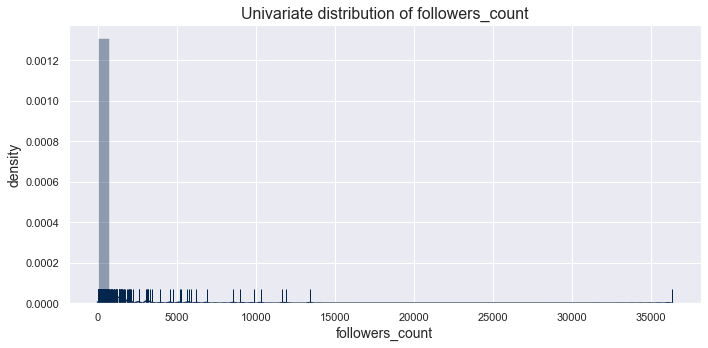

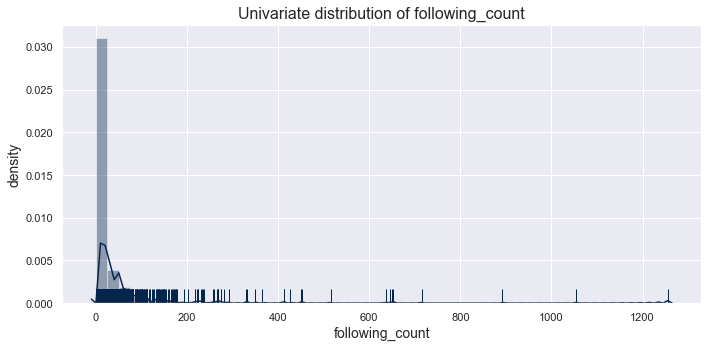

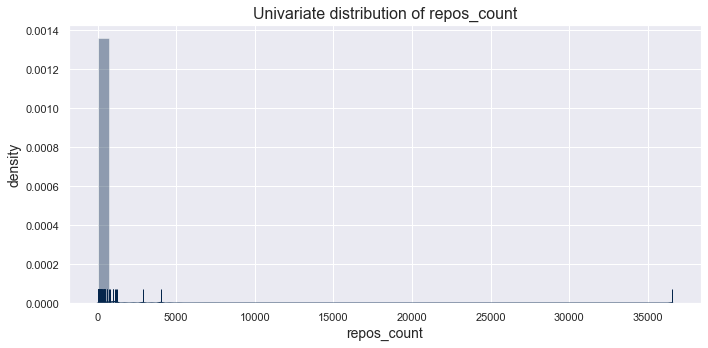

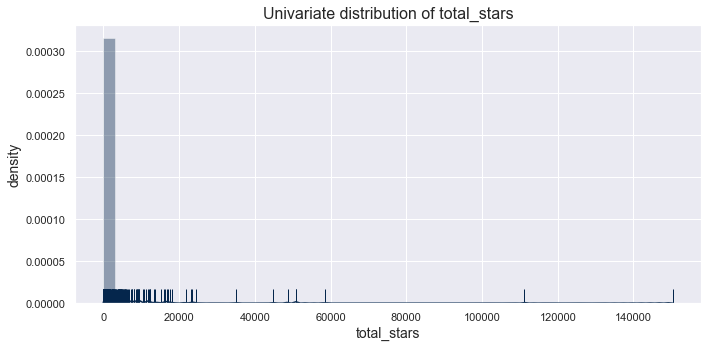

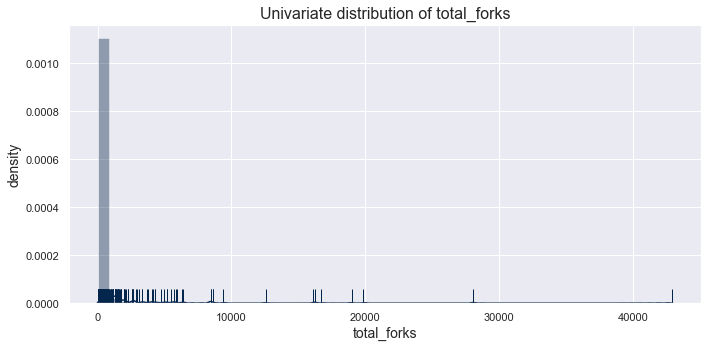

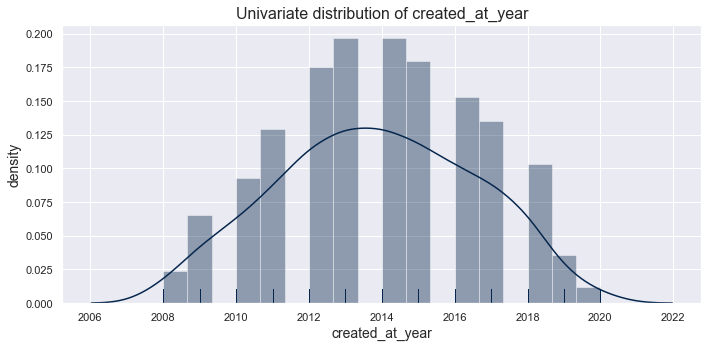

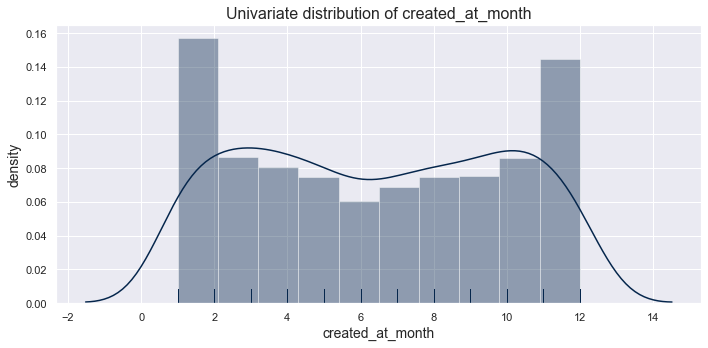

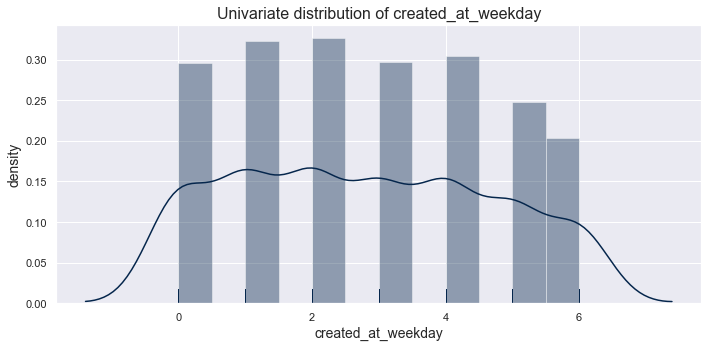

In [22]:
# histograms
for col in numeric_cols:
    plt.figure(figsize=(10, 5))
    sns.distplot(df[col], color=blue[4], rug=True, kde=True)
    plt.title(f'Univariate distribution of {col}',fontsize=16)
    plt.xlabel(col,fontsize=14)
    plt.ylabel('density',fontsize=14)
    plt.tight_layout()

Boxplots are good supplements to histograms. They show the quartiles of the data while the whiskers extend to show the rest of the distribution.

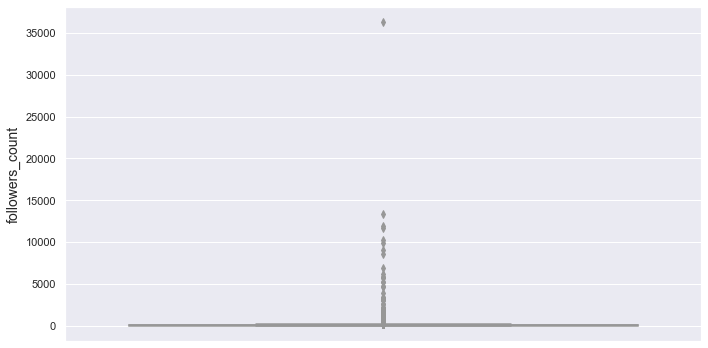

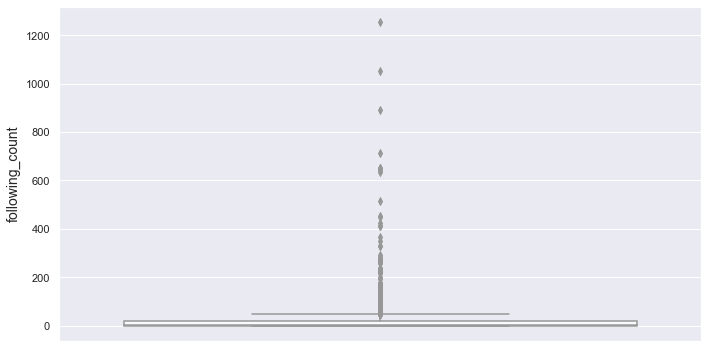

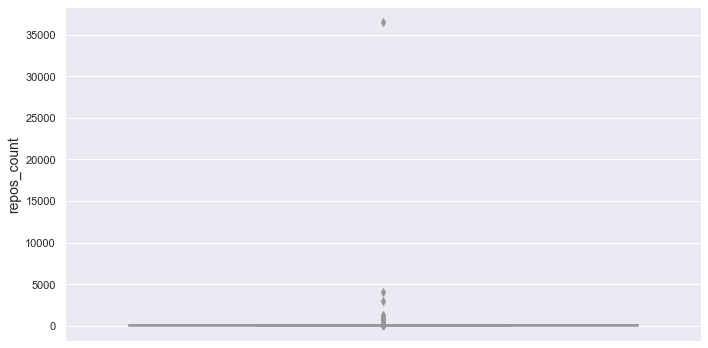

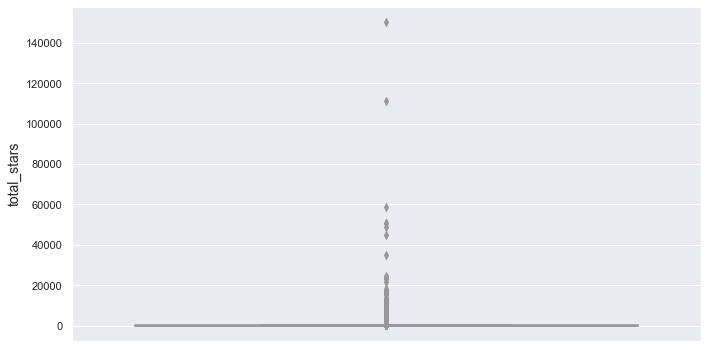

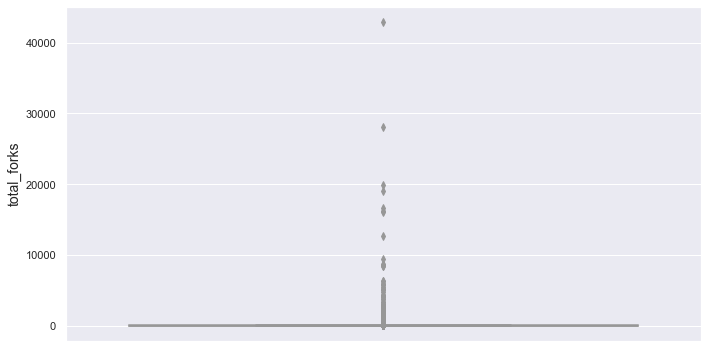

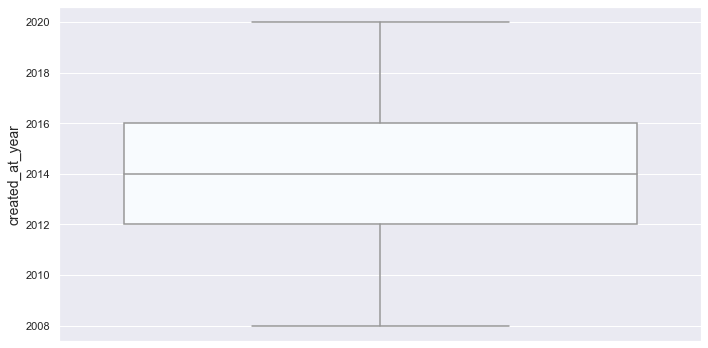

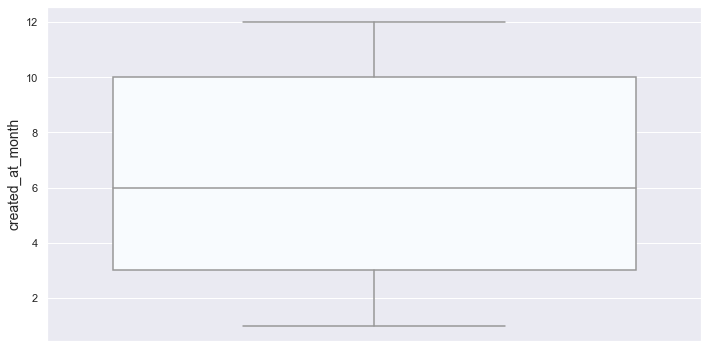

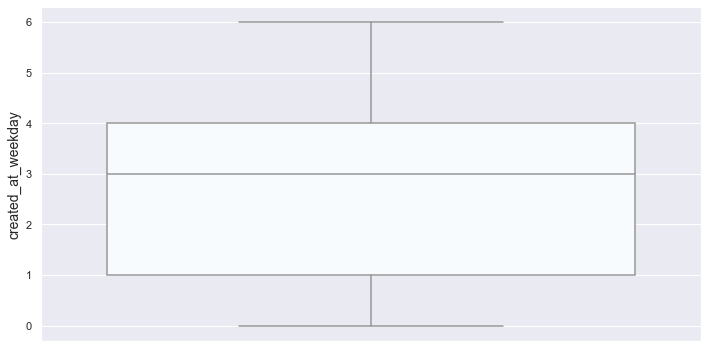

In [23]:
# boxplots
for col in numeric_cols:
    plt.figure(figsize=(10, 5))
    sns.boxplot(y=df[col],color=blue[0])
    plt.ylabel(col,fontsize=14)
    plt.tight_layout()

The distributions for `followers_count`, `following_count`, `repos_count`, `total_stars` and `total_forks` are all wide and right skewed with some outliers. The temporal variables have distributions as expected. Since our purpose of this preliminary analysis is to explore the data, there is no need to remove the outliers. Besides, since we are looking at differences of individual users, it is actually quite interesting to include e.g. the user that has way more followers, repos, stars or forks than the other users. 

We investigate some of the non-numeric variables using bar charts with their counts. 

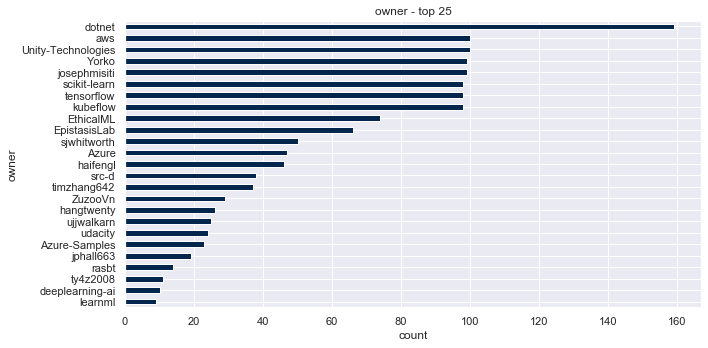

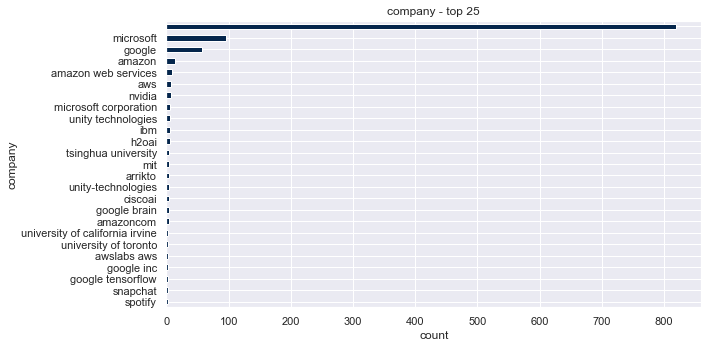

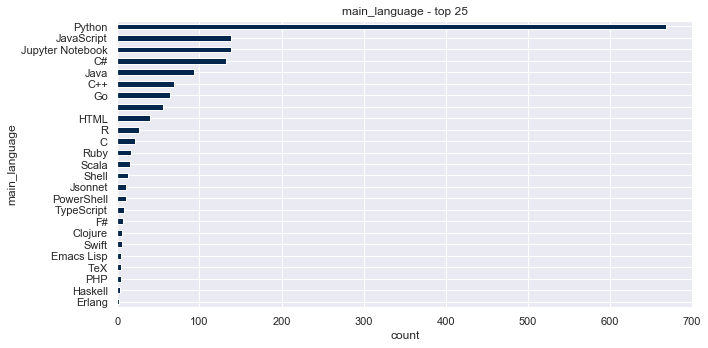

In [24]:
def bar_charts(cols):
    for col in cols:
        df[col].value_counts()[:25].plot.barh(color=blue[4], figsize=(10,5))
        plt.title(f'{col} - top 25')
        plt.gca().invert_yaxis()
        plt.xlabel('count')
        plt.ylabel(col)
        plt.tight_layout()
        plt.show()
        
bar_charts(['owner', 'company', 'main_language'])

The largest owner of repositories is 'dotnet' with a count of almost 160 observations. Since we scraped the owners and contributors of the top machine learning repositories as our users (observations), this actually means almost 160 users are contibutors of dotnet's repositories. This user is therefore very central among the machine learning developers. 

Most observations/users do not have a company stated on their profile (seen as blank above). Among the existing companies, Microsoft and Google are clearly the largest ones, which makes good sense.

Python is the most used programming language in the repositories without doubt, followed by JavaScript, Jypiter Notebook and C#. 

### 2.2.2 Correlation

We investigate relevant numeric variables against one another to reveal potential pairwise relationships in the data. Seaborn's `pairplot` is used to plot multiple pairwise bivariate distributions, with scatter plots and KDE on the diagonal. The correlation matrix is visualzed using Seaborn's `heatmap`. 

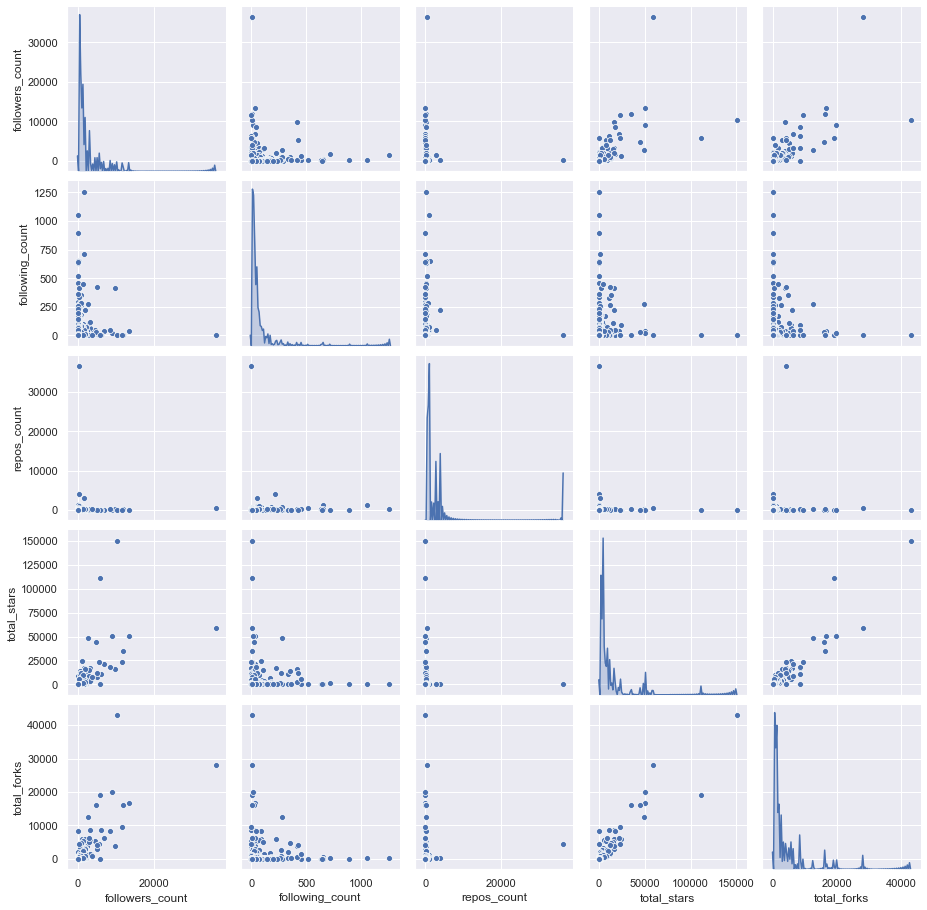

In [25]:
sns.set()
pairplot = sns.pairplot(df[numeric_cols[:5]], diag_kind='kde', palette=blue[4])
plt.show()

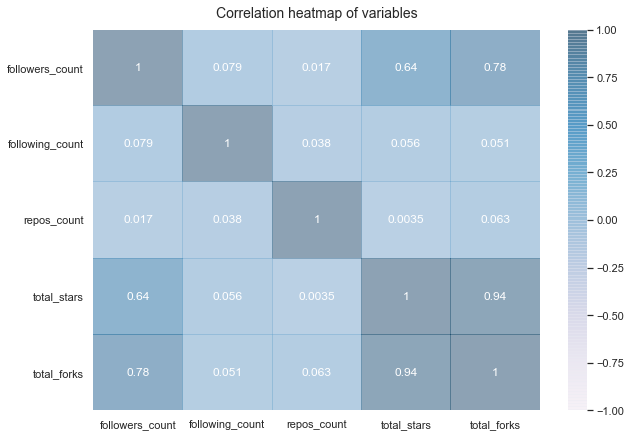

In [26]:
plt.figure(figsize=(10, 7))
heatmap = sns.heatmap(df[numeric_cols[:5]].corr(), vmin=-1, vmax=1, annot=True, cmap='PuBu', alpha=0.4)
heatmap.set_title('Correlation heatmap of variables', fontsize=14, pad=12)
plt.show()

It is seen that `total_stars` and `total_forks` seem to be dependent variables, which shows that if a user has many stars on its repositories, it also tends to have many forks. Further, `followers_count` seem to depend on number of `total_forks` and `total_starts`, which makes sense, since users forking or starring repositories also are likely to follow the owner of those repositories. None of the variables are negatively correlated. 

# 3 Tools, theory and analysis
<font color='teal'>
    
*Structure:*
    
* Explain the overall idea
* Analysis step 1-n: explain what you're interested in, explain the tool, apply the tool, discuss the outcome

*Content:*
    
* Explain work with text, including regular expressions, unicode, etc.
* Describe network science tools and data analysis strategies used, how those network science measures work, and why the tools you've chosen are right for the problem
* How did you use the tools to understand your dataset?

In this section, we go deeper and perform more thourough analyses of the data using different tools and theoretical consepts. The analyses carrried out in three main steps:

1. Network analysis
2. Spacio-temporal analysis
3. Community analysis

The idea is to start with an extensive analysis of the whole network of GitHub users, and then look at the network in terms of space and time, to add some perspective. Lastly, we will dig even deeper through detecting and exploring possible communities within the network. 

## 3.1 Network analysis

Firstly, we construct our network of GiHhub users. We analyse the network according to network theory including looking at centrality measures, degree distributions, the power-law and scale-free property and the Friendship paradox. The network graph is visualized, before we move on to our text analysis of user bios and repository descriptions. Lastly, the individual users and their sentiments are analysed in detail.

### 3.1.1 Network construction

The network of Github users is created using the Python package `networkx` for the creation, manipulation, and study of the structure, dynamics, and functions of complex networks. Since the users can either follow others or be followed by others, we generate a directed network using `DiGraph`. The users in the data are added as nodes and the users following each other get an edge between their nodes.

We make the assuption that important nodes or users have many connections. We extract the **weakly connected component (WCC)**, which is the maximal subgraph of the directed graph such that for every pair of edges $u$, $v$ in the subgraph, there is an undirected path from $u$ to $v$ and a directed path from $v$ to $u$. This using `weakly_connected_components` which generates a sorted list of WCCs. Since we are interested in the largest one, we take the maximum of the WWCs. We then end up with the **giant connected component (GCC)**, that contains a significant proportion of the entire nodes or users in the network. 

In [27]:
# create network
G = nx.DiGraph()

# add nodes as users
G.add_nodes_from(df['user_name'].values)

# add edges as users following each other 
for row in df.iterrows():
    z = [(row[1]['user_name'], other_node) for other_node in row[1]['following_relevant']]
    G.add_edges_from(z)
    
print(f"Number of nodes in total network: {G.number_of_nodes()}")
print(f"Number of edges in total network: {G.number_of_edges()}\n")
    
# extract giant connected component 
WCC = max(nx.weakly_connected_components(G), key=len)
GCC = G.subgraph(WCC)

print(f"Number of nodes in GCC: {GCC.number_of_nodes()}")
print(f"Number of edges in GCC: {GCC.number_of_edges()}")

Number of nodes in total network: 1585
Number of edges in total network: 2092

Number of nodes in GCC: 737
Number of edges in GCC: 2072


### 3.1.2 Centrality

We are now interested what centrality measures can reveal about the users of the network, so we find the most central users according to three selected measures of centrality.  
 

The **degree centrality** is defined as the number of edges incident upon a node. Thus the degree can be interpreted as the risk of a node catching the information flowing through the network. In a directed network it makes sense to use **in- and out-degree** as measures of the degree centrality. 

The **eigenvector centrality** empathizes the influence of a node in the network. It assigns relative scores to all the nodes based on the assumption that connections to high-scoring nodes contribute more to the score than connections to low-scoring nodes. Again, we differentiate between edges going in- and out from the nodes.

In the **betweenness centrality** measure, the algorithm chooses two random nodes, calculates the shortest path and give the nodes with high probability to occur on this path high centrality. Thus these the users with high betweenness centrality will often act as a bridges in the network between randomly chosen users.

In [28]:
df['in_degree'] = df['user_name'].apply(lambda x: G.in_degree(x))
print('Most central users according to in-degree')
display(df.sort_values(by=['in_degree'], ascending=False)[['user_name','name','in_degree']].head())

df['out_degree'] = df['user_name'].apply(lambda x: G.out_degree(x))
print('Most central users according to out-degree')
display(df.sort_values(by=['out_degree'], ascending=False)[['user_name','name','out_degree']].head())

df['degree'] = df['user_name'].apply(lambda x: G.degree(x))
print('Most central users according to in and out-degree')
display(df.sort_values(by=['degree'], ascending=False)[['user_name','name','degree']].head())

Most central users according to in-degree


,user_name,name,in_degree
367,amueller,Andreas Mueller,67
417,ogrisel,Olivier Grisel,63
574,fchollet,François Chollet,58
26,llSourcell,Siraj Raval,56
3,rasbt,Sebastian Raschka,55


Most central users according to out-degree


,user_name,name,out_degree
1178,yupbank,Peng Yu,68
575,feihugis,Fei Hu,43
1124,gaocegege,Ce Gao,42
1320,silverstone1903,,41
1042,justinormont,Justin Ormont,36


Most central users according to in and out-degree


,user_name,name,degree
367,amueller,Andreas Mueller,83
417,ogrisel,Olivier Grisel,82
1178,yupbank,Peng Yu,72
155,soumith,Soumith Chintala,64
3,rasbt,Sebastian Raschka,60


In [29]:
in_eigen = nx.eigenvector_centrality(G)
out_eigen = nx.eigenvector_centrality(G.reverse())

print('Most central users according to in-degree eigenvector centrality')
display(collections.Counter(in_eigen).most_common(5))

print('Most central users according to out-degree eigenvector centrality')
display(collections.Counter(out_eigen).most_common(5))

Most central users according to in-degree eigenvector centrality


[('ogrisel', 0.44055357943091344),
 ('agramfort', 0.3484398684718544),
 ('mblondel', 0.30402005562617135),
 ('pprett', 0.2698176707372807),
 ('vene', 0.2375071036019066)]

Most central users according to out-degree eigenvector centrality


[('yupbank', 0.2612257136078677),
 ('silverstone1903', 0.2592137093891132),
 ('apachaves', 0.21936799935615497),
 ('agramfort', 0.21416338347714328),
 ('glemaitre', 0.1887849086807974)]

In [30]:
bet_cent = nx.betweenness_centrality(GCC)
print('Most central users according to betweenness centrality')
display(collections.Counter(bet_cent).most_common(5))

Most central users according to betweenness centrality


[('terrytangyuan', 0.09648487859801513),
 ('gaocegege', 0.07463776920774008),
 ('rhiever', 0.049414006309301726),
 ('yupbank', 0.03785999702955615),
 ('agramfort', 0.03299643577630381)]

We see that the users ogrisel and silverstone1903, are central according to both degree- and eigenvector centrality. Further, the users agramfort and yupfort is has a lot of influence both when it comes to in and out-degree eigenvector centrality and betweenness centrality.

### 3.1.3 Degree distribution
We analyse the degrees of the nodes even further to reveal how the users are connected to each other. Thus, we look at how the node's degrees are distributed both for the total network and the GCC. 

The degree distributions are plotted both on a linear scale, but also on a double logarithmic scale using a `loglog` plot, as the nodes have widely different degrees, so that a linear plot is unable to display them all. 

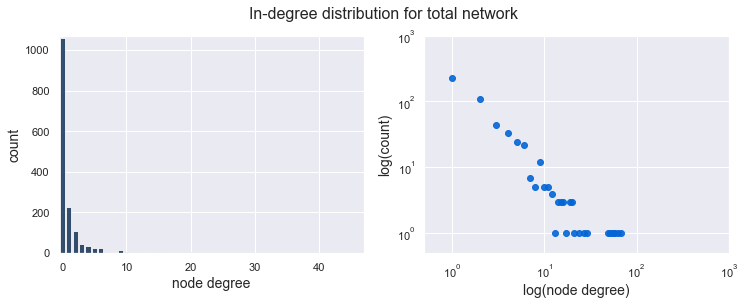

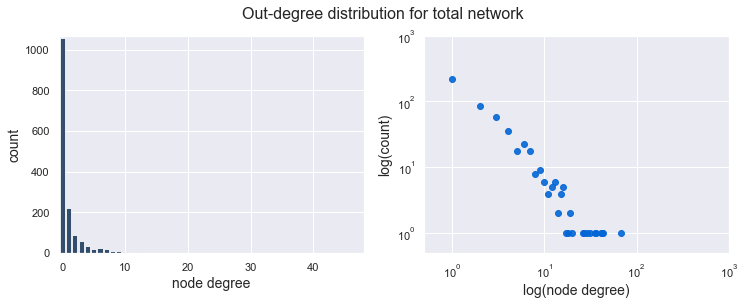

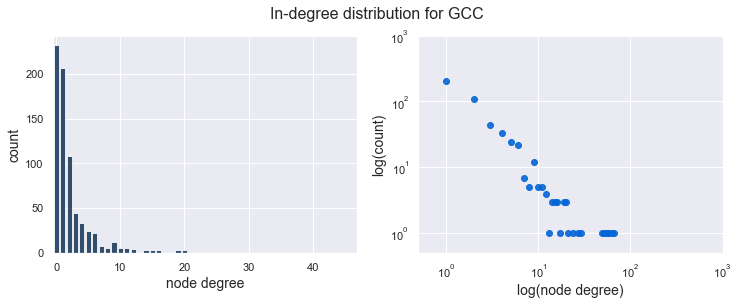

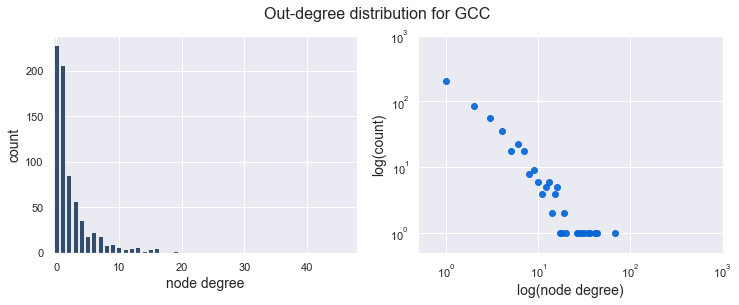

In [31]:
def degree_distribution(G, mode, network):
    
    # find in or out degrees of network
    if mode.lower() == 'in':
        degree_sequence = [d for n, d in G.in_degree()]
    else:
        degree_sequence = [d for n, d in G.out_degree()]
    
    # find min and max of degrees     
    dmax = max(degree_sequence)
    dmin = min(degree_sequence)
    
    # compute frequencies of degrees distribution
    counts, bins = np.histogram(degree_sequence, bins = np.arange(dmin-0.5, dmax+1.5,1))
    
    # set style, figure size and title
    sns.set()
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = [12,4])
    fig.suptitle(mode+'-degree distribution for '+network,fontsize=16)
    
    # plot histogram 
    ax1.bar(np.arange(dmin, dmax+1,1), counts, color=blue[4], alpha=0.8)
    ax1.set_xlim(-0.5, dmax-20)
    ax1.set_ylim(-0.5, max(counts)+10)
    ax1.set_xlabel('node degree',fontsize=14)
    ax1.set_ylabel('count',fontsize=14)
    
    # plot scatter plot on log-log scale
    ax2.loglog(np.arange(dmin, dmax+1,1), counts, 'o', color=blue[2], alpha=0.9)
    ax2.set_xlim(0.5, 10**3)
    ax2.set_ylim(0.5, 10**3)
    ax2.set_xlabel('log(node degree)',fontsize=14)
    ax2.set_ylabel('log(count)',fontsize=14)
    plt.show()
    
degree_distribution(G,'In','total network')
degree_distribution(G,'Out','total network')

degree_distribution(GCC,'In','GCC')
degree_distribution(GCC,'Out','GCC')

Both the in- and out-degree distributions are asymmetric as they are right skewed with long tails, and are quite similar. The distributions for the GCC naturally has lower counts for the smaller node degrees, as the nodes that are not part of the largest connected component are removed. Although most users have zero or small degrees, there are a few users with a large degree as well. This indicates the presence a few users that are highly connected to other users in the network, like the ones we detected with measures of centrality in the previous section.

These **highly connected hubs** of users can be seen as responsible for keeping the network connected, but they are also quite rare. This means the long tail degree distributions are resilient to random removal of nodes, but vulnerable to removal of the impoortant hub nodes. So a removal of one of the key users would have a huge impact on the network stucture. Since the hubs of key users are highly connected, they collect information about other key users fast, but they also spread information quickly to other users. So the probability of connectivity does not have to be large for some information to reach this selected (machine learning related) part of GitHub, since the variance of the node distributions are large.

The log-log plots of the distributions demonstrate that the network follows the **power-law degree distribution**. This, because as the scatter points tend to fall along lines. Networks with such distributions are called **scale-free networks**, since power laws have the same functional form at all scales. The size of the hubs grows polynomially with network size, hence they can grow quite large in scale-free networks. 

This is a typical property of **real world networks**, as opposed to **random networks** whose distributions follow a Poisson distribution and the size of the largest node grows logarithmically or slower with the number of nodes, implying that hubs will be small even in huge random networks [[3]](http://networksciencebook.com/chapter/4#hubs).

We further explore the related [Friendship paradox](https://en.wikipedia.org/wiki/Friendship_paradox), which states that _almost everyone_ have fewer friends than their friends have, on average. We repeat the following three steps 1000 times to find out how many times the friendship paradox is true.

* Pick a node _i_ at random and find its degree
* Find _i_'s neighbors and calculate their average degree 
* Compare the two numbers to check if it's true that _i_'s friends (on average) have more friends than _i_.



In [32]:
def friendship_paradox(G):

    nodes = [n for n in G.nodes]
    fp = np.zeros(1000)

    for idx, it in enumerate(fp):
        node_i = random.choice(nodes) # pick random node
        k_i = G.degree(node_i) # find degree
        neigh_i = [n for n in G.neighbors(node_i)] # find degree of each neighbor
        neigh_avg_k = np.mean([G.degree(i) for i in neigh_i]) # find average degree of neighbors

        fp[idx] = neigh_avg_k > k_i # compare numbers 

    print('friendship paradox is true {} out of 1000 times'.format(sum(fp)))
    
print('GGC:')
friendship_paradox(GCC)

GGC:
friendship paradox is true 592.0 out of 1000 times


The friendship paradox is true most of the times for the GCC. It makes sense since "we are more likely to be friends with hubs than with small-degree nodes, because hubs have more friends than the small nodes" [[4]](http://networksciencebook.com/chapter/7#measuring-degree).

Lastly, we look at the correlation between the in- and out-degree and observe a small positive correlation, so that a higher in-degree seem to give a higher out-degree as well (and opposite).

Correlation coefficient: 0.25


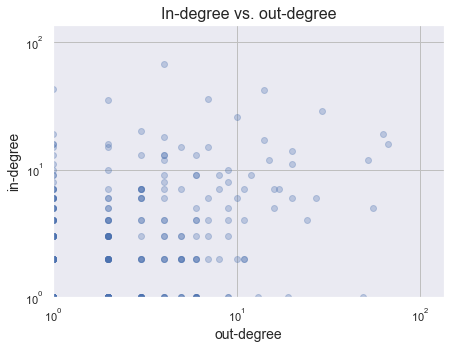

In [33]:
in_degree = [d for n, d in G.in_degree()]
out_degree = [d for n, d in G.out_degree()]
corr = np.corrcoef(x=out_degree, y=in_degree)[0, 1]
print('Correlation coefficient: {0}'.format(np.round(corr,2)))

sns.set()
fig, ax = plt.subplots(figsize = [7,5])
ax.set_title("In-degree vs. out-degree", fontsize=16)
ax.set_xlabel("out-degree",fontsize=14)
ax.set_ylabel("in-degree",fontsize=14)
ax.grid(True, linestyle='-', color='0.75')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim([1, max(in_degree) * 2])
ax.set_ylim([1, max(out_degree) * 2])
plt.scatter(in_degree, out_degree, alpha=0.3)
plt.show()

### 3.1.4 Visualisation

In this part, we create visualizations of the GCC of the network. A first step here is to transform the network from being directed to undirected, which eases the visualization with `networkx` and `forceatlas2`. The nodes are scaled according to their node degree, i.e. the nodes with the most connections to other nodes will appair with larger node size. The nodes are positioned based on the Force Atlas 2 algorithm, which is placing each node spatially depending on its connection to the other nodes. This force directed layout allows a better visual interpretation of the structure of the network. Force Atlas 2 comes with different settings which allows us to affect the placement of the nodes and thereby the shape of the network to get a new perspectives. We further use `plotly` to construct an interactive graph, where it is possible to see the different users with a hover tool.

**Network graph**

In [34]:
# convert to undirected graph
giant = GCC.to_undirected()

# scale node-size according to degree
d = dict(giant.degree)
sizes = [v * 10 for v in d.values()]

# settings for the Force Atlas 2 algorithm
forceatlas2 = ForceAtlas2(
    # behavior alternatives
    outboundAttractionDistribution=True, # dissuade hubs
    linLogMode=False,  
    adjustSizes=False,
    edgeWeightInfluence=1.0,

    # performance
    jitterTolerance=1.0,  # tolerance
    barnesHutOptimize=True,
    barnesHutTheta=1.2,
    multiThreaded=False,  

    # tuning
    scalingRatio=2.0,
    strongGravityMode=False,
    gravity=1.0,

    # log
    verbose=True)

# get positions based on theForce Atlas 2 algorithm
positions = forceatlas2.forceatlas2_networkx_layout(giant, pos=None, iterations=1000)

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:18<00:00, 52.84it/s]

BarnesHut Approximation  took  2.34  seconds
Repulsion forces  took  15.58  seconds
Gravitational forces  took  0.09  seconds
Attraction forces  took  0.05  seconds
AdjustSpeedAndApplyForces step  took  0.38  seconds


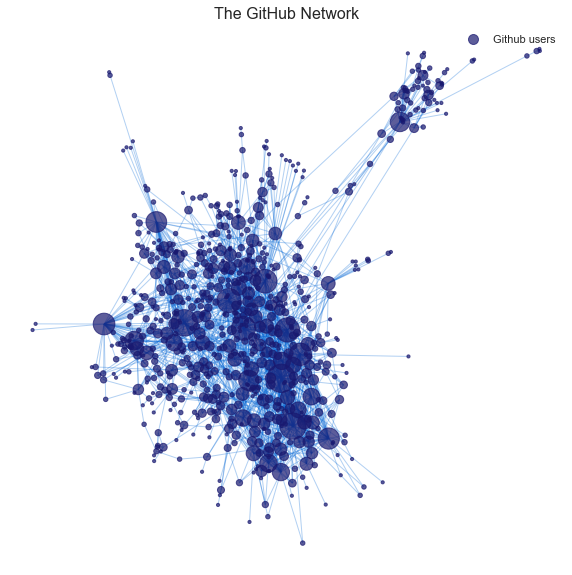

In [35]:
# set style, figure size and title
sns.set()
fig = plt.figure(figsize=(10,10))
plt.title('The GitHub Network', fontsize=16)

# draw network
nx.draw_networkx_nodes(giant, positions, node_color=blue[5], alpha=0.7, node_size=sizes)
nx.draw_networkx_edges(giant, positions, edge_color=blue[2], alpha=0.3)
 
# create legend and remove axes 
plt.scatter([], [], c=blue[5], alpha=0.7, s=100, label='Github users')
plt.legend(scatterpoints=1, frameon=False, labelspacing=1)
plt.axis('off')
plt.show()

In [36]:
def make_edge(x, y,text,geo,col):

    if geo==True:
        fig = go.Scattergeo(lon         = y,
                            lat         = x,
                            line      = dict(width = 0.2,
                                   color = col),
                
                       hoverinfo = 'text',
                       text      = ([text]),
                            mode      = 'lines')

    else:
        fig = go.Scatter(x  = x,
                   y         = y,
                   line      = dict(width = 0.5,
                               color = col),

                   hoverinfo = 'text',
                   text      = ([text]),
                   mode      = 'lines')
    return fig

def plotly_graph(graph,pos_list,title,geo):
    
    midsummer = graph  
    pos = pos_list
        
    
    conts = ['North America', 'Europe', 'Asia', 'Oceania',
       'South America', 'Africa','Other']

    colors =  ['#d62728','#1f77b4','#2ca02c','#ff7f0e','#9467bd','#bcbd22','#7f7f7f']


    # make edge trace
    edge_trace = []
    for edge in midsummer.edges():
        
        char_1 = edge[0]
        char_2 = edge[1]
        
        if len(midsummer.nodes[char_1])>0:
            try:
                if midsummer.nodes[char_1]['continent']!= midsummer.nodes[char_2]['continent']:
                    col = colors[6]
                else:
                    col = colors[conts.index(midsummer.nodes[char_1]['continent'])]
            except:
                col=colors[6]
        else:
            col=colors[6]
            
            
        if geo==True:
            x0, y0 = midsummer.nodes[char_1]['pos']
            x1, y1 = midsummer.nodes[char_2]['pos']
  
        else:         
            x0, y0 = pos[char_1]
            x1, y1 = pos[char_2]
            
        text   = char_1 + '--' + char_2      
        trace  = make_edge([x0, x1, None], [y0, y1, None], text,geo,col)
    
       
        edge_trace.append(trace)

    # Make a node trace
    if geo == True:
        node_trace = go.Scattergeo(lon         = [],
                            lat         = [],
                            text      = [],
                            textposition = "top center",
                            textfont_size = 1,
                            mode      = 'markers+text',
                            hoverinfo = 'text',
                            marker    = dict(color = [],
                                             size  = [],
                                             line  = None))
    else:
         node_trace = go.Scatter(x         = [],
                            y         = [],
                            text      = [],
                            textposition = "top center",
                            textfont_size = 1,
                            mode      = 'markers+text',
                            hoverinfo = 'text',
                            marker    = dict(color = [],
                                             size  = [],
                                             line  = None))
    
    # For each node in midsummer, get the position and size and add to the node_trace
    for node in midsummer.nodes():
        if geo == True:
                   
            lat,lon = midsummer.nodes[node]['pos']
            node_trace['lat'] += tuple([lat])
            node_trace['lon'] += tuple([lon])
            node_trace['marker']['color'] += tuple([colors[conts.index(midsummer.nodes[node]['continent'])]])
            node_trace['text'] += tuple(['<b>' + node + ':' + midsummer.nodes[node]['continent'] + '</b>' ])
            
            deg = dict(midsummer.degree)[node]
            if deg<5:
                deg = 5
            else:
                deg = deg/2

            node_trace['marker']['size'] += tuple([deg])
        
        else:
            x, y = pos[node]
            node_trace['x'] += tuple([x])
            node_trace['y'] += tuple([y])
            
            if len(midsummer.nodes[node])>0:
                try:
                    node_trace['marker']['color'] += tuple([colors[conts.index(midsummer.nodes[node]['continent'])]])
                    node_trace['text'] += tuple(['<b>' + node + ' - ' + midsummer.nodes[node]['continent'] + '</b>' ])
                except:
                    node_trace['marker']['color'] += tuple([colors[6]])
                    node_trace['text'] += tuple(['<b>' + node + ' - ' + 'Other' + '</b>' ])
                
            else:
                node_trace['marker']['color'] += tuple([colors[6]])
                node_trace['text'] += tuple(['<b>' + node +'</b>' ])
        
            deg = dict(midsummer.degree)[node]
            if deg<5:
                deg = 5
            
        
            node_trace['marker']['size'] += tuple([deg])
            
           
            
        


    # Customize layout
    layout = go.Layout(
        paper_bgcolor='rgba(0,0,0,0)', # transparent background
        plot_bgcolor='rgba(0,0,0,0)', # transparent 2nd background
        xaxis =  {'showgrid': False, 'zeroline': False}, # no gridlines
        yaxis = {'showgrid': False, 'zeroline': False}, # no gridlines
    )
    # Create figure
    fig = go.Figure(layout = layout)
    # Add all edge traces
    for trace in edge_trace:
        fig.add_trace(trace)
    # Add node trace
    fig.add_trace(node_trace)
    # Remove legend
    fig.update_layout(showlegend = False)
    fig.update_layout(title_text=title)
    # Remove tick labels
    trace1 = fig.update_xaxes(showticklabels = False)
    fig.update_yaxes(showticklabels = False)
    fig.update_layout(height=450, margin={"r":0,"t":0,"l":0,"b":0})
    
    # Show figure
    return fig

In [37]:
fig = plotly_graph(giant, positions, 'The GitHub Network', False)
fig.write_html("visualizations/gcc.html")

### 3.1.6 User analysis

It is now time to analyze the users more deeply to find out which users are central in the network and worth following based on followers, stars, forks, repositories and sentiment.

In [38]:
top_followers = df.sort_values(by='followers_count', axis=0, ascending=False)
fig = px.bar(top_followers[:100], x='user_name', y='followers_count', hover_data=['followers_count'])
fig.update_layout(height=450, width=750, title_text='The most popular users')
fig.show()

In [39]:
top_following = df.sort_values(by='following_count', axis=0, ascending=False)
fig = px.bar(top_following[:100], x='user_name', y='following_count', hover_data=['following_count'])
fig.update_layout(height=450, width=750, title_text='Fan users following other users the most')
fig.show()

In [40]:
# determine what percentage of followers top 1% of users get
top = int(len(top_followers) * 0.01)
perc = sum(top_followers.iloc[0: top,:].loc[:, 'followers_count'])/sum(top_followers.followers_count)*100
print(f'1 % of the top users have {round(perc,1)} % of the followers')

1 % of the top users have 42.2 % of the followers


In [41]:
top_followers = df.sort_values(by='followers_count', axis=0, ascending=False)
fig = px.bar(top_followers[:100], x='user_name', y='followers_count', hover_data=['followers_count'])
fig.update_layout(height=450, width=750, title_text='The most popular users')
fig.show()

In [42]:
top_stars = df.sort_values(by='total_stars', axis=0, ascending=False)
fig = px.bar(top_stars[:100], x='user_name', y='total_stars', hover_data=['total_stars'])
fig.update_layout(height=450, width=750, title_text='Users with the most stars')
fig.show()

In [43]:
top_forks = df.sort_values(by='total_forks', axis=0, ascending=False)
fig = px.bar(top_forks[:100], x='user_name', y='total_forks', hover_data=['total_forks'])
fig.update_layout(height=450, width=750, title_text='Users with the most forks')
fig.show()

In [44]:
top_repos = df.sort_values(by='repos_count', axis=0, ascending=False)
fig = px.bar(top_repos[:100], x='user_name', y='repos_count', hover_data=['repos_count'])
fig.update_layout(height=450, width=750, title_text='Users with the most repositories')
fig.show()

### 3.1.5 Text analysis

The aim in this part is to examine the text on the user profiles as well as repositories, as it might reveal something new. 

To be able to analyse the text, it needs to be tokenized and cleaned. This is done by splitting the text string into words, transforming to only having lower letters, removing stopwords, lemmatizing and removing words with numbers. 

We analyse the words of the user bios and repository descriptions based on **term frequency**. Here, we also include the languages used in the repositories, to better get an overview of the most used languages. We find the term frequency for each word in the texts and use the `FreqDist` function from the `nltk` module to get the frequency of each word [[5]](http://www.nltk.org/book/ch01.html). 

The term frequencies are presented graphically using **wordclouds**, where words with higher term frequency appear larger thereby representing that they are more important. Since we scraped our users from searching for the top "machine learning" repositories, it is clear that both machine and learning are highly used words. Since we do not want these words to dominate too much, we remove them from the frequency distributions. 

Furthermore, we combine the text in the bios and descriptions and analyse their complexity or readability. This by computing the **LIX number**. For a text with A words, B words strictly more than 6 letters and C sentences, this number is given as follows:

$$ LIX = \frac{A}{C}+\frac{100B}{A} $$
 
The number is rounded to nearest integer and the higher the LIX value, the more difficult the text is. Less than 25 is easy, over 55 is very hard like scientific articles or legalese, lastly between 35 and 44 is the medium as in magasines etc. We find this number for each user combining their biography and repositiry descriptions. This is done to assess the complexity within their language either confirming or rejecting the hypothesis that people in coding communities communicate in a more complex way. Note that we only consider a text by its lix number if it has more than 50 words.

In [45]:
# tokenize and clean text
mis = []
def tokenize(df,col):
    df[f'Tokens_{col}'] = ""
    for i,content in enumerate(df[col]):
        try:
            text = content.translate(str.maketrans('', '', string.punctuation)).split() # split to tokens
            sw = stopwords.words("english") # set stopwords
            wordnet_lemmatizer = WordNetLemmatizer() # set lemmatizer
            words1= [t.lower() for t in text] # lower letters
            words11 = [t for t in words1 if t not in sw]   # remove stopwords
            words2 = [wordnet_lemmatizer.lemmatize(t) for t in words11]  # lemmatize
            words3 = [x for x in words2 if not any(c.isdigit() for c in x)] # remove words with numbers
            df[f'Tokens_{col}'][i] = words3
        except:
            mis.append(i)

tokenize(df,'description')
tokenize(df,'bio')
df['Tokens_used_languages'] = df['used_languages']

# function for finding the term frequency for single words
def get_TF(df,col):
    words = []
    for x in df[f'Tokens_{col}']:
        words.extend(x)

    TF = FreqDist(words)

    return TF, words

# function for finding the term frequency for bigrams
def get_TF_bigram(df,col):
    words = []
    for x in df[f'Tokens_{col}']:
        words.extend(x)
        
    words = ['-'.join(v) for v in nltk.bigrams(words)]

    TF = FreqDist(words)

    return TF, words

In [46]:
def one_color_func(word=None, font_size=None, 
                   position=None, orientation=None, 
                   font_path=None, random_state=None):
    h = 188 # 0 - 360
    s = 100 # 0 - 100
    l = 22 # 0 - 100
    return "hsl({}, {}%, {}%)".format(h, s, l)

def overall_wordcloud(df, col,TF):
    
    
    TFF =TF(df,col)[0]
    
    wordcloud = WordCloud(background_color="#D3D3D3", max_words=2000, max_font_size=256, color_func=one_color_func)
    wordcloud.generate_from_frequencies(TFF)
      # plot the WordCloud image  
    img = plt.imshow(wordcloud, interpolation='bilinear')    
    
   

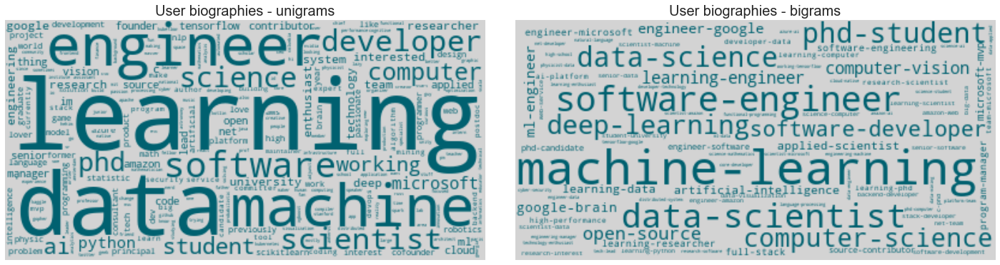

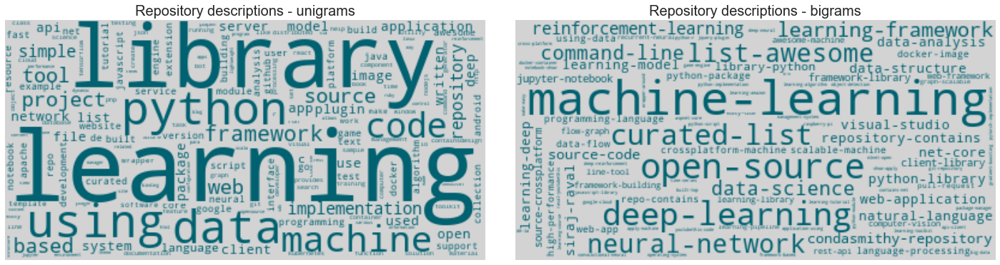

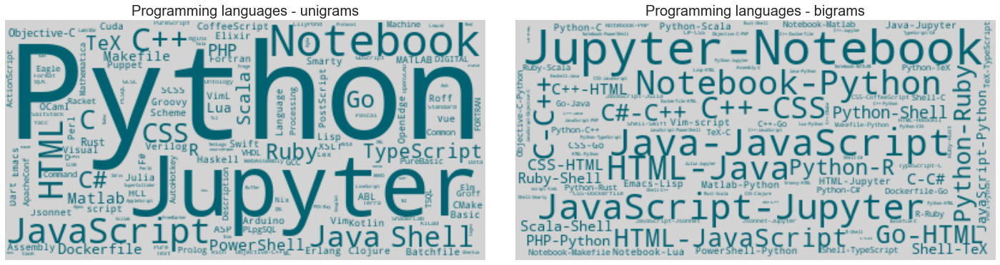

In [47]:
sns.set()
#plt.figure(figsize=(20,40))
# create subplots
titles = ['User biographies','Repository descriptions','Programming languages']
cols= ['bio','description','used_languages']
for col,tit in zip(cols,titles):
    plt.figure(figsize=(20,15))
    #fig1 =plt.figure(figsize=(10,5))
    #plt.subplot(n_top,3,(i*3)+1)
    plt.subplot(3,2,1)
    overall_wordcloud(df,col,get_TF) 
    plt.axis("off")
    #fig1.savefig(f'visualizations/{tit} - unigrams.png', bbox_inches='tight', pad_inches=0)
    plt.title(f'{tit} - unigrams',fontsize=20)    
   
  #  plt.subplot(n_top,3,(i*3)+2) 
    #fig2 =plt.figure(figsize=(10,5))
    plt.subplot(3,2,2)
    overall_wordcloud(df,col,get_TF_bigram) 
    plt.axis("off")
   # fig2.savefig(f'visualizations/{tit} - bigrams.png', bbox_inches='tight', pad_inches=0)
    plt.title(f'{tit} - bigrams',fontsize=20)
  
    plt.tight_layout()    
    plt.show()

    
plt.show()

It is seen from the bios that many users seem to be engineers, scientiest, students, phds, researchers and developers, indicating the network has well educated and hard working users. There are clearly some similarities between the wordclouds in the way data is among the most central words in the user bios and repository descriptions. Furthermore, Python is big not only for the programming languages, but also for the repository descriptions, and a bit smaller for the bios. So GitHub is definitely popular for Python users as previously seen, but we observe that many other languages are also used. 

Below, we played around with the shape of the wordclouds to find a nice visualization to use on the webpage. 

In [48]:
# get shape from image
mask = np.array(Image.open(r"data/github.png"))
TFF_des = get_TF(df,'description',get_TF)[0]

# create WordCloud
wordcloud = WordCloud(background_color='white', mask=mask, collocations = False).generate_from_frequencies(TFF_des)
plt.figure(figsize=(10, 10), facecolor = None)
img = plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: 'data/github.png'

In [49]:
# find lix number
df['lix_num'] =''
text_string = df['description']+ '.' + df['bio']
for i,tokens in enumerate(text_string):  
    
    o = 0
    p = 0
    l = 0
    s = tokens
    s = re.sub('([.,!?()])', r' \1 ', s)
    s = re.sub('\s{2,}', ' ', s)
    s = re.sub(r"(\w)([A-Z])", r"\1 . \2", s)
    tokens = s.split()
    for token in tokens: 
        if token in '.':
            p += 1
            continue
        o += 1
        if len(token) > 6:
            l += 1
    if o<=50:
        df['lix_num'][i] = np.nan
    else:
        df['lix_num'][i] = np.round(o/p + l*100/o)

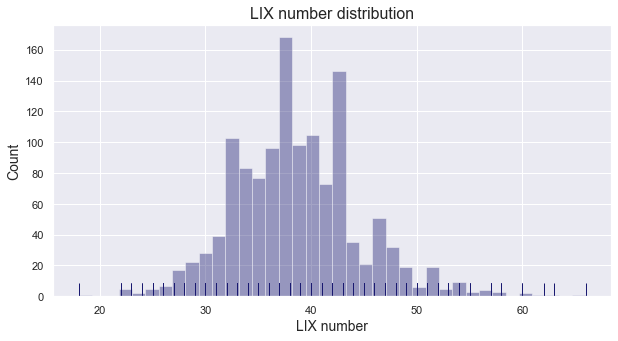

In [50]:
plt.figure(figsize=(10, 5))
sns.distplot(df['lix_num'].dropna(), color=blue[5], rug=True, kde=False)
plt.title('LIX number distribution',fontsize=16)
plt.xlabel('LIX number',fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.show()

In [51]:
num=5
col='lix_num'

print(f'Top {num} highest lix')
display(df.sort_values(by=[col],ascending=False)[['user_name','lix_num']].head(5))

print(f'\nTop {num} lowest lix')
display(df.sort_values(by=[col],ascending=True)[['user_name','lix_num']].head(5)[::-1])

Top 5 highest lix


,user_name,lix_num
645,deFang,66
805,5665tm,63
449,Alexkats87,62
1577,sohnam,60
70,AmazaspShumik,60



Top 5 lowest lix


,user_name,lix_num
999,NeoXtreem,23
306,paledger,22
1076,tyclintw,22
1030,endintiers,22
1467,boumanb,18


### 3.1.7 Sentiment analysis

In this part, we introduce **sentiment analysis** of the repository descriptions and biographies written by the individual users. We determine the happiness or sadness for each user by comparing the words, expressed as lower case tokens, in the above mentioned text data to a predefined list of words with a related happiness score. This list is available from the article [Temporal Patterns of Happiness and Information in a Global Social Network: Hedonometrics and Twitter](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0026752). We look at the distribution of the sentiment score for the users as well as the top 5 happiest and saddest users based on their repository descriptions and biographies, respectively. 

In [52]:
word_df = pd.read_csv('data/happiness_text.txt',skiprows=2,sep='\t')
display(word_df.head(3))
display(word_df.tail(3))

,word,happiness_rank,happiness_average,happiness_standard_deviation,twitter_rank,google_rank,nyt_rank,lyrics_rank
0,laughter,1,8.50,0.9313,3600,--,--,1728
1,happiness,2,8.44,0.9723,1853,2458,--,1230
2,love,3,8.42,1.1082,25,317,328,23


,word,happiness_rank,happiness_average,happiness_standard_deviation,twitter_rank,google_rank,nyt_rank,lyrics_rank
10219,rape,10220,1.44,0.7866,3133,--,4115,2977
10220,suicide,10221,1.30,0.8391,2124,4707,3319,2107
10221,terrorist,10222,1.30,0.9091,3576,--,3026,--


By inspection, we actually found the word 'python' in this word list. As we know that this word is associated to a programming language and not the 'snake', we remove it from the list for it not to cause an impact on the sentiment. 

In [53]:
display(word_df[word_df['word']=='python'])
word_df = word_df[word_df['word']!='python']

,word,happiness_rank,happiness_average,happiness_standard_deviation,twitter_rank,google_rank,nyt_rank,lyrics_rank
8974,python,8975,4.22,1.799,3897,--,--,--


In [54]:
def sentiment(tokens):
    # find words that are in the 'happiness list'
    sim_words = list(set(tokens) & set(word_df['word']))
    # frequency count
    fd = FreqDist([word for word in tokens if word in sim_words])
    sent = word_df[word_df['word'].isin(
        sim_words)][['word', 'happiness_average']]  # get happiness scores
    sent['freq'] = sent['word']
    sent = sent.replace({"freq": fd})
    final_sent = np.mean(sent['happiness_average']*sent['freq'])
    
    return sent, final_sent

In [55]:
df['Sentiment_desc'] = ""
df['Desc_happy'] = ""
df['Desc_sad'] = ""
df['Sentiment_bio'] = ""
df['Bio_happy'] = ""
df['Bio_sad'] = ""

for i in range(len(df)):
    
    tokens1=df['Tokens_description'].iloc[i]
    tokens2=df['Tokens_bio'].iloc[i]
    
    df['Sentiment_desc'][i] = sentiment(tokens1)[1]
    df['Desc_happy'][i] = list(sentiment(tokens1)[0][:3]['word'])
    df['Desc_sad'][i] = list(sentiment(tokens1)[0][-3:]['word'])
    
    df['Sentiment_bio'][i] = sentiment(tokens2)[1]
    df['Bio_happy'][i] = list(sentiment(tokens2)[0][:3]['word'])
    df['Bio_sad'][i] =  list(sentiment(tokens2)[0][-3:]['word'])
    

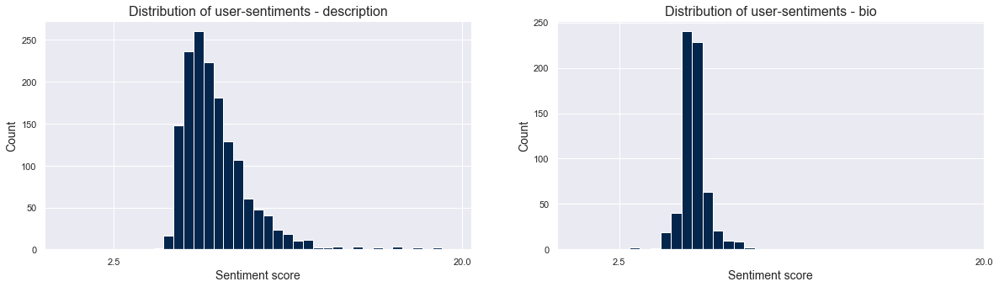

In [56]:
# distribution of user sentiments
sns.set()
plt.figure(figsize=(20, 5))

plt.subplot(121)
bins = [x*0.5 for x in list(range(40))]
plt.hist(df['Sentiment_desc'].dropna(), color=blue[4], bins=bins)
plt.title('Distribution of user-sentiments - description', fontsize=16)
plt.xlabel('Sentiment score',fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.xticks([2.5,20])

plt.subplot(122)
bins = [x*0.5 for x in list(range(20))]
plt.hist(df['Sentiment_bio'].dropna(), color=blue[4], bins=bins)
plt.title('Distribution of user-sentiments - bio', fontsize=16)
plt.xlabel('Sentiment score',fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.xticks([2.5,20])
plt.show()

In [59]:
def happy_sad(df,col,num,name):
    
    df_not = df[df[col].notna()].reset_index(drop=True)
    s =col.split('_')[1]

    print(f'Top {num} happiest')
    display(df_not.sort_values(by=[col],ascending=False)[[name,col,f'{s.capitalize()}_happy']].head(num))

    print(f'\nTop {num} saddest')
    display(df_not.sort_values(by=[col],ascending=True)[[name,col,f'{s.capitalize()}_sad']].head(num)[::-1])
    

In [61]:
print(titles[1])
print('\n')
happy_sad(df,'Sentiment_desc',5,'user_name')

Repository descriptions


Top 5 happiest


,user_name,Sentiment_desc,Desc_happy
1376,gitter-badger,111.241,"[happiness, love, happy]"
103,bryant1410,36.9437,"[love, excellent, music]"
1074,cclauss,28.4664,"[excellent, win, music]"
1295,pechyony,25.5644,"[learning, car, add]"
254,rohduggal,19.8645,"[free, amazing, awesome]"



Top 5 saddest


,user_name,Sentiment_desc,Desc_sad
820,chriselion,5.192,"[hook, c, problem]"
456,Qovaxx,5.18923,"[using, diagnosis, cancer]"
809,animaleja32,5.18571,"[machine, nothing, worse]"
510,thesimanjan,5.045,"[ever, chart, bug]"
507,schigin,4.72,"[testing, command]"


In [62]:
print(titles[0])
print('\n')
happy_sad(df,'Sentiment_bio',5,'user_name')

User biographies


Top 5 happiest


,user_name,Sentiment_bio,Bio_happy
353,automata,13.64,[create]
556,McCulloughRT,10.76,"[love, design, city]"
35,WillKoehrsen,10.68,"[science, scientist, towards]"
99,ShengKungYi,8.885,"[game, application, math]"
148,wenhan-wu,8.51,"[know, must]"



Top 5 saddest


,user_name,Sentiment_bio,Bio_sad
382,strange-jiong,4.7,[c]
271,optas,4.52,[previously]
109,dangsonbk,4.285,"[im, dont, lost]"
226,weakish,3.28,[lazy]
399,p1gd0g,3.28,[lazy]


### 3.1.8 Sub-discussion
blablabla

## 3.2 Spacio-temporal analysis

In this part, we first look into the development of the network over time defined by the date on which the user profile was created. Here we seek to answer trends regarding programming language. Secondly, we analyze the network based on geographical location in order to determine the connections across continents and patterns related to location. For this purpose, we create a new network where each node has an attribute of location determined by latitude and longitude as well as an attribute for the continent that the user is located in. 


### 3.2.1 Development
We start by exploring the network accross time in order to reveal any development trends for GitHub. We see that most users in this network created a profile between 2012 and 2016.

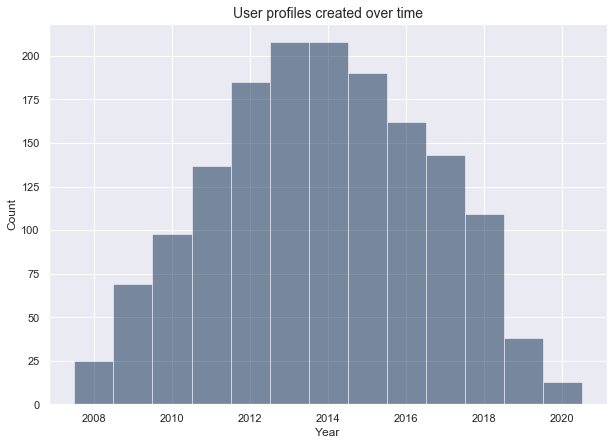

In [63]:
years_count = np.unique(df['created_at_year'],return_counts=True)
years = years_count[0]
bins = [y-0.5 for y in list(years)+[2021]]
plt.figure(figsize=(10,7))
plt.hist(df['created_at_year'],bins=bins,color=blue[4],alpha=0.5)
plt.title('User profiles created over time',fontsize=14)
plt.ylabel('Count')
plt.xlabel('Year')
plt.show()

Next, we define a function to create a network for each year indvidually as well as the overall evolution and visualize it. Hereafter, we create a dataframe with use of programming languages and top users for each year. 

In [64]:
year_com = [years[0:i] for i in range(1,len(years)+1)]

def get_year(year_range):   

    df_year = df[df['created_at_year'].isin(year_range)]
    G = nx.DiGraph()
    G.add_nodes_from(df_year['user_name'].values)

    for row in df_year.iterrows():
        z = [(row[1]['user_name'], other_node) for other_node in row[1]['following_relevant']]
        G.add_edges_from(z)

    # extract giant connected component 
    largest_cc = max(nx.weakly_connected_components(G), key=len)
    GCC = G.subgraph(largest_cc)
    giant = GCC.to_undirected()

    return df_year, giant

def year_detail(year_range):
    giant2 = get_year(year_range)[1]
    positions = forceatlas2.forceatlas2_networkx_layout(giant2, pos=None, iterations=100)  
    
    d = dict(giant2.degree)
    sizes = [v *10 for v in d.values()]
    
    return giant2, positions,sizes

In [65]:
graphs_year= []
positions_year = []
sizes_year =[]

for y in year_com:    
    g1 = year_detail(y)[0]
    pos1 = year_detail(y)[1]
    size1 =  year_detail(y)[2]
  
    graphs_year.append(g1)
    positions_year.append(pos1)
    sizes_year.append(size1)


 75%|████████████████████████████████████████████████████████████                    | 75/100 [00:00<00:00, 744.59it/s]

BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds
BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds
BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

BarnesHut Approximation  took  0.02  seconds
Repulsion forces  took  0.09  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.01  seconds
BarnesHut Approximation  took  0.02  seconds
Repulsion forces  took  0.08  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.01  seconds


 51%|████████████████████████████████████████▊                                       | 51/100 [00:00<00:00, 506.31it/s]

BarnesHut Approximation  took  0.01  seconds
Repulsion forces  took  0.10  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.01  seconds


 60%|████████████████████████████████████████████████                                | 60/100 [00:00<00:00, 595.65it/s]

BarnesHut Approximation  took  0.03  seconds
Repulsion forces  took  0.14  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.01  seconds


 48%|██████████████████████████████████████▍                                         | 48/100 [00:00<00:00, 449.79it/s]

BarnesHut Approximation  took  0.03  seconds
Repulsion forces  took  0.12  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.01  seconds


 23%|██████████████████▍                                                             | 23/100 [00:00<00:00, 223.90it/s]

BarnesHut Approximation  took  0.03  seconds
Repulsion forces  took  0.16  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.01  seconds


 23%|██████████████████▍                                                             | 23/100 [00:00<00:00, 221.75it/s]

BarnesHut Approximation  took  0.06  seconds
Repulsion forces  took  0.33  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.01  seconds


 22%|█████████████████▌                                                              | 22/100 [00:00<00:00, 214.16it/s]

BarnesHut Approximation  took  0.05  seconds
Repulsion forces  took  0.37  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.01  seconds


100%|███████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 164.64it/s]


BarnesHut Approximation  took  0.07  seconds
Repulsion forces  took  0.48  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.02  seconds


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

BarnesHut Approximation  took  0.12  seconds
Repulsion forces  took  0.81  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.02  seconds


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

BarnesHut Approximation  took  0.08  seconds
Repulsion forces  took  0.62  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.02  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 97.63it/s]


BarnesHut Approximation  took  0.13  seconds
Repulsion forces  took  0.80  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.03  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 54.49it/s]


BarnesHut Approximation  took  0.52  seconds
Repulsion forces  took  1.20  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.04  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 68.04it/s]


BarnesHut Approximation  took  0.17  seconds
Repulsion forces  took  1.21  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.03  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 90.74it/s]


BarnesHut Approximation  took  0.14  seconds
Repulsion forces  took  0.90  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.03  seconds


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

BarnesHut Approximation  took  0.16  seconds
Repulsion forces  took  1.28  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.03  seconds


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

BarnesHut Approximation  took  0.26  seconds
Repulsion forces  took  0.91  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.02  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 86.97it/s]


BarnesHut Approximation  took  0.11  seconds
Repulsion forces  took  0.97  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.03  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 83.64it/s]


BarnesHut Approximation  took  0.14  seconds
Repulsion forces  took  1.01  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.02  seconds


  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

BarnesHut Approximation  took  0.28  seconds
Repulsion forces  took  1.11  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.02  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 78.44it/s]


BarnesHut Approximation  took  0.14  seconds
Repulsion forces  took  1.09  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.02  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 66.14it/s]


BarnesHut Approximation  took  0.14  seconds
Repulsion forces  took  1.30  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.03  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 57.16it/s]


BarnesHut Approximation  took  0.18  seconds
Repulsion forces  took  1.47  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.04  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 62.89it/s]


BarnesHut Approximation  took  0.31  seconds
Repulsion forces  took  1.22  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.02  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:02<00:00, 49.90it/s]


BarnesHut Approximation  took  0.20  seconds
Repulsion forces  took  1.71  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.04  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 55.69it/s]


BarnesHut Approximation  took  0.18  seconds
Repulsion forces  took  1.53  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.04  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:02<00:00, 41.21it/s]


BarnesHut Approximation  took  0.41  seconds
Repulsion forces  took  1.89  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.04  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 53.18it/s]


BarnesHut Approximation  took  0.17  seconds
Repulsion forces  took  1.62  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.03  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:02<00:00, 49.73it/s]


BarnesHut Approximation  took  0.20  seconds
Repulsion forces  took  1.71  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.03  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:02<00:00, 43.34it/s]


BarnesHut Approximation  took  0.36  seconds
Repulsion forces  took  1.84  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.04  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:02<00:00, 49.01it/s]


BarnesHut Approximation  took  0.20  seconds
Repulsion forces  took  1.74  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.04  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:02<00:00, 38.11it/s]


BarnesHut Approximation  took  0.43  seconds
Repulsion forces  took  2.04  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.06  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 30.84it/s]


BarnesHut Approximation  took  0.38  seconds
Repulsion forces  took  2.68  seconds
Gravitational forces  took  0.02  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.06  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 26.43it/s]


BarnesHut Approximation  took  0.32  seconds
Repulsion forces  took  3.22  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.09  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 28.15it/s]


BarnesHut Approximation  took  0.48  seconds
Repulsion forces  took  2.89  seconds
Gravitational forces  took  0.02  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.06  seconds


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:02<00:00, 36.29it/s]

BarnesHut Approximation  took  0.25  seconds
Repulsion forces  took  2.35  seconds
Gravitational forces  took  0.01  seconds
Attraction forces  took  0.01  seconds
AdjustSpeedAndApplyForces step  took  0.05  seconds


In [66]:
#for i in range(len(years)):
 #   fig_y = plotly_graph(graphs_year[i],positions_year[i],'',False)
  #  fig_y.write_html(f"data/year{i}.html")


Development of network from 2008-2020


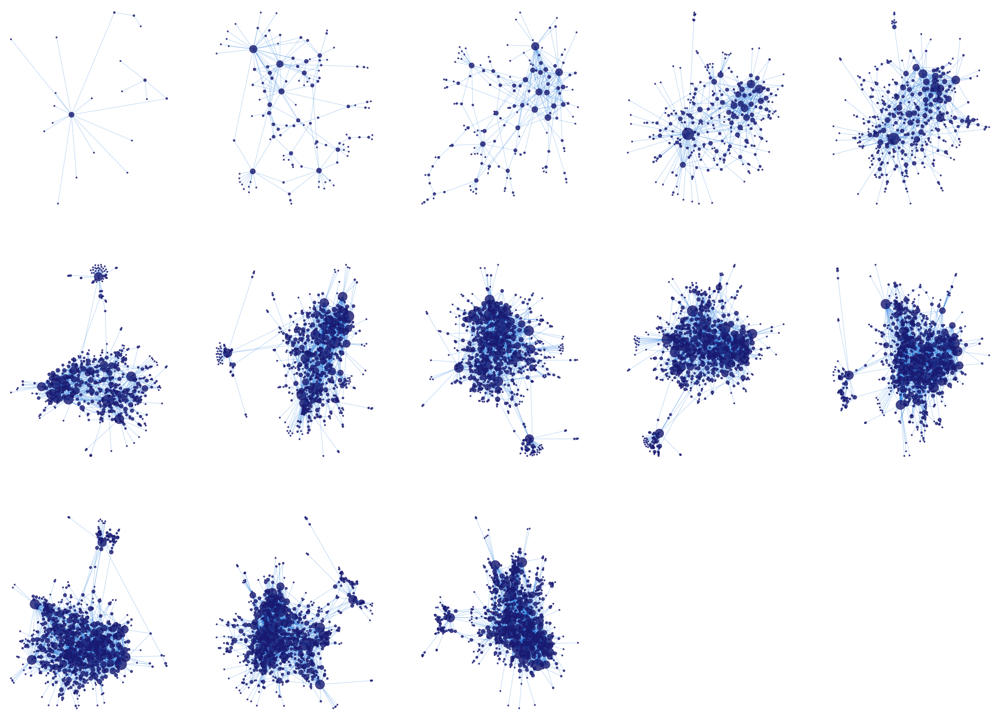

In [67]:
# set style, figure size and title
sns.set()
plt.figure(figsize=(40,40))

for i in range(len(year_com)):
    
    comnum=i
    
    plt.subplot(4,5,i+1)

    # draw network
    nx.draw_networkx_nodes(graphs_year[comnum], positions_year[comnum], node_color=blue[5], alpha=0.8, node_size=sizes_year[comnum])
    nx.draw_networkx_edges(graphs_year[comnum], positions_year[comnum], edge_color=blue[2], alpha=0.3)
   # plt.scatter([], [], c=blue[5], alpha=0.9, s=100, label='Github users')
    
   # plt.legend(scatterpoints=1, frameon=False, labelspacing=1)
    plt.axis('off')
    #plt.title(f'Community {top[i]}')

print('Development of network from 2008-2020')
plt.show()


In [68]:
df_year = pd.DataFrame()
df_year['Years'] = years 

names = []
names2 = []
nodes= []
Python = []
Notebook = []
JavaScript = []
Java = []
Cplus = []
Csharp = []

for y in years:
    com_df = get_year([y])[0].reset_index(drop=True)
    
    langs = np.unique(list(com_df['main_language']),return_counts=True)[0]
    c_langs = np.unique(list(com_df['main_language']),return_counts=True)[1]
    name = langs[np.argsort(c_langs)[-3:]][::-1]
  
    names.append('-'.join(name)) # name communities    
    
    top3 = list(np.argsort(com_df['degree'])[-3:]) # get top three most connected characters
    name2 = [com_df['user_name'][idx] for idx in top3][::-1]
    connects = [com_df['degree'][idx] for idx in top3][::-1]   
  
    names2.append('-'.join(name2))
    
    
    Python.append(c_langs[np.where(langs=='Python')])
    Notebook.append(c_langs[np.where(langs=='Jupyter Notebook')])
    JavaScript.append(c_langs[np.where(langs=='JavaScript')])
    Java.append(c_langs[np.where(langs=='Java')])
    Cplus.append(c_langs[np.where(langs=='C++')])
    Csharp.append(c_langs[np.where(langs=='C#')])
    
    nodes.append(len(com_df))
    

df_year['Nodes'] = nodes   

df_year['Python'] = Python
df_year['Jupyter Notebook'] = Notebook
df_year['JavaScript'] = JavaScript
df_year['Java'] = Java
df_year['C++'] = Cplus
df_year['C#'] = Csharp

for col in df_year.columns[2:]:
    df_year[col] =df_year[col] .apply(lambda y: 0 if len(y)==0 else y[0])

     

df_year['Top_languages'] = names
df_year['Top_usernames'] = names2
display(df_year)

,Years,Nodes,Python,Jupyter Notebook,JavaScript,Java,C++,C#,Top_languages,Top_usernames
0,2008,25,9,0,4,1,0,0,Python-JavaScript-Go,linkerlin-npinto-alextp
1,2009,69,35,1,6,5,9,3,Python-C++-JavaScript,ogrisel-agramfort-pprett
2,2010,98,43,2,13,5,7,5,Python-JavaScript-C++,amueller-mblondel-josephmisiti
3,2011,137,53,5,22,9,5,9,Python-JavaScript-Go,yupbank-fchollet-llSourcell
4,2012,185,76,5,22,15,7,19,Python-JavaScript-C#,soumith-apachaves-rhiever
5,2013,208,90,17,22,17,6,16,Python-JavaScript-Jupyter Notebook,rasbt-gaocegege-feihugis
6,2014,208,81,13,17,14,8,21,Python-C#-JavaScript,silverstone1903-glemaitre-awjuliani
7,2015,190,94,23,11,11,6,17,Python-Jupyter Notebook-C#,chiphuyen-aymericdamien-qinhanmin2014
8,2016,162,67,26,12,6,6,15,Python-Jupyter Notebook-C#,swiftdiaries-raybellwaves-caisq
9,2017,143,60,16,5,6,8,9,Python-Jupyter Notebook-,aaroey-alfaro96-wdevazelhes


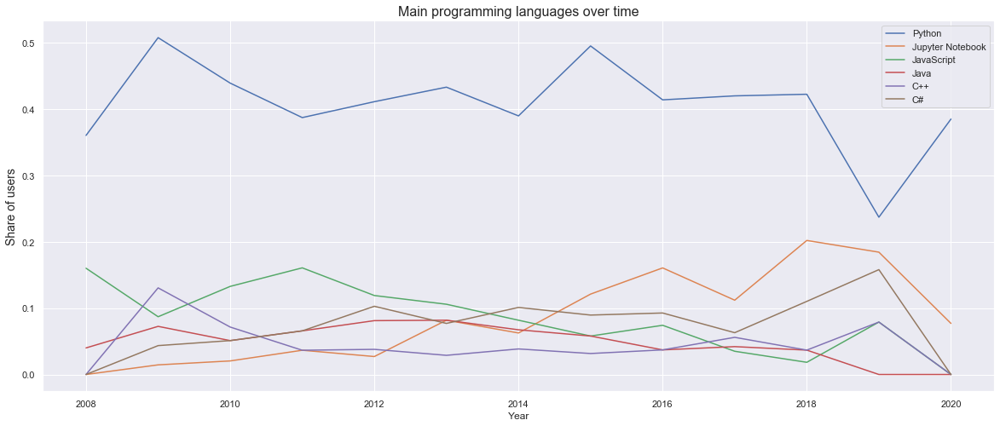

In [69]:
plt.figure(figsize=(20,8))

for i, col in enumerate(df_year.columns[2:8]):
    
    plt.plot(df_year['Years'],(df_year[col]/df_year['Nodes']),label=col)
    
    
plt.legend()
plt.title('Main programming languages over time',fontsize=16)
plt.ylabel('Share of users',fontsize=14)
plt.xlabel('Year')
plt.show()

It can be seen that Python is by far the most popular language across the entire timespan. However, interesting is to see how the use of the Jupyter Notebook has increased. This is not directly a programming language, though an open-source web application often used in connection to the Python language. The notebook allows an easier sharing of documents that contain live code, equations, visualizations and narrative text, hence the increase in usage must imply a trend of users wanting to more easily connect and share their work.  Java and Javascript have however both decreased in popularity, while C# and C++ seem to rather stable in popularity. 


### 3.2.2 Locations

In this part, we take a closer look at the geographical location of the users and trends regarding the different continents. Important to mention here is that we exclusively look at the users that actually have a location attached to them in the data set, that is only 949 out of the total 1585. 

In [70]:
location_df = pd.merge(location_df, df[['user_name']+list(df.columns[-12:])], how='left', on = ['user_name'])
print(f'Total users: {len(df)}')
print(f'Users with location: {len(location_df)}')

Total users: 1585
Users with location: 949


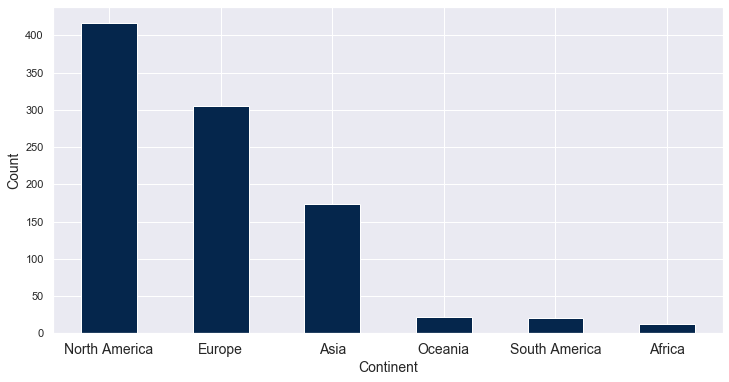

In [71]:
location_df['continent'].value_counts().plot.bar(color=blue[4], figsize=(12,6))
plt.xlabel('Continent',fontsize=14)
plt.ylabel('Count',fontsize=14)
plt.xticks(rotation=0, fontsize=14)
plt.show()

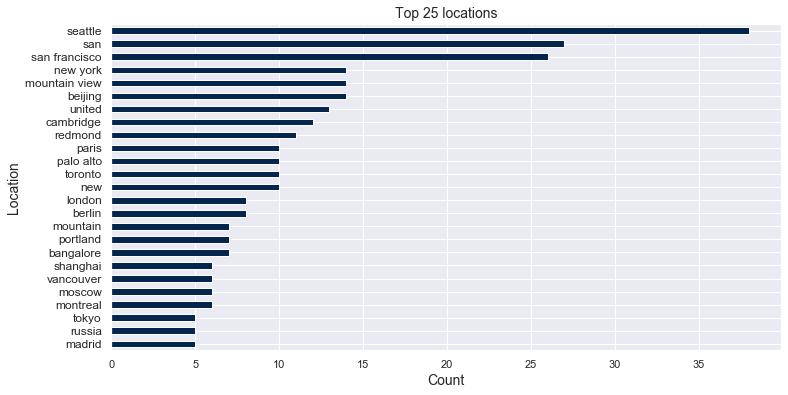

In [72]:
df['location'].str.split(' ').str[:-1].str.join(' ').value_counts()[1:26].plot.barh(color=blue[4], figsize=(12,6))
plt.ylabel('Location',fontsize=14)
plt.xlabel('Count',fontsize=14)
plt.yticks(fontsize=12)
plt.gca().invert_yaxis()
plt.title('Top 25 locations',fontsize=14)
plt.show()

In [73]:
stat =location_df.groupby(['continent']).mean().reset_index().round(2)
stat2 = stat[stat.columns[:4]]
stat2['Nodes'] = list(location_df.groupby(['continent']).count()['user_name'])


names = []
names2 = []
nodes= []
stat2['Sentiment_desc'] = ''
stat2['Sentiment_bio'] = ''
stat2['Avg_LIX'] = ''


for i,cont in enumerate(stat2['continent']):
    
    com_df = location_df[location_df['continent']==cont].reset_index(drop=True)

    langs = np.unique(list(com_df['main_language']),return_counts=True)[0]
    c_langs = np.unique(list(com_df['main_language']),return_counts=True)[1]
    name = langs[np.argsort(c_langs)[-3:]][::-1]
  
    names.append('-'.join(name)) # name communities    
    
    top3 = list(np.argsort(com_df['degree'])[-3:]) # get top three most connected characters
    name2 = [com_df['user_name'][idx] for idx in top3][::-1]
    connects = [com_df['degree'][idx] for idx in top3][::-1]   
  
    names2.append('-'.join(name2))    
    nodes.append(len(com_df))
    
    stat2['Sentiment_desc'][i] = com_df['Sentiment_desc'].mean().round(2)
    stat2['Sentiment_bio'][i] = com_df['Sentiment_bio'].mean().round(2)
    stat2['Avg_LIX'][i] = com_df['lix_num'].mean().round(2)


stat2['Top_languages'] = names
stat2['Top_usernames'] = names2
print('The top variables are from left to right as top 1, 2, 3')
display(stat2)

The top variables are from left to right as top 1, 2, 3


,continent,followers_count,following_count,repos_count,Nodes,Sentiment_desc,Sentiment_bio,Avg_LIX,Top_languages,Top_usernames
0,Africa,72.67,12.50,34.42,12,7.5,6.35,35.82,Python-JavaScript-Shell,ezhulenev-dotnet-bot-espoirMur
1,Asia,300.43,43.31,50.00,173,7.56,6.11,38.47,Python-JavaScript-Jupyter Notebook,gaocegege-qinhanmin2014-wepe
2,Europe,145.45,27.12,60.10,305,7.74,6.13,39.1,Python-C#-Jupyter Notebook,ogrisel-agramfort-glemaitre
3,North America,351.94,28.35,61.83,417,7.81,6.06,38.41,Python-JavaScript-C#,amueller-yupbank-soumith
4,Oceania,328.86,35.45,69.86,22,7.98,6.12,39.32,Python-Jupyter Notebook-Java,layumi-jnothman-trevorstephens
5,South America,76.20,59.60,67.50,20,7.84,6.48,40.05,Python-Java-Ruby,kelvins-AmazaspShumik-gleydson404


From this initial analysis of the continents, we again see an overall trend of using the Python programming language, howevr it seems that in Asia they are more into using JavaScript than in Europe where they prefer C#. In North America, these three languages are all represented in the top three most used. By inspecting the sentiments, no significant difference can be seen. Interestingly, it seems that the despite the less number of users from Oceania, the users on average have the second highest number of followers, that is 329.

And now for the visualizations. For an initial overview, we started by using `folium`, which allows us to quickly cluster the users on an open-street map based on their location coordinates. Then we moved on to inspecting the network, by incorporating colors for the nodes dependent on their related continent attribute using `networkx.draw`. Here we used the `force2atlas` algorithm as previously introduced to decide on the positions of the nodes. Lastly, for an interactive network map, we introduced `plotly.graph_objects.Scattergeo ` allowing us to clearly inspect the hubs and the across-continent connections. 

In [74]:
# base map
m = folium.Map(tiles=None)

# add tile layers to the map
folium.TileLayer('cartodbpositron', show=True, name="light").add_to(m)
folium.TileLayer('cartodbdark_matter', show=False, name="dark").add_to(m)
folium.TileLayer('openstreetmap', show=False, name="color").add_to(m)

# add location marker clusters
mc = MarkerCluster(name='User locations')
#df_loc = location_df.dropna(subset=['latitude','longitude']).reset_index(drop=True)
sw = location_df[['latitude','longitude']].min().values.tolist()
ne = location_df[['latitude','longitude']].max().values.tolist()
m.fit_bounds([sw, ne]) 

# create marker at locations
for lat, lon, location, user_name, followers, following, stars in zip(location_df['latitude'], location_df['longitude'], location_df['location'], location_df['user_name'],
                                                                      location_df['followers_count'], location_df['following_count'], location_df['total_stars']):
    text = folium.Html('User name: {}<br> Location: {}<br> Followers: {}<br> Following: {}<br> Stars: {}<br>'.format(user_name, location, followers, following, stars), script=True)
    popup = folium.Popup(text, max_width=300)
    folium.CircleMarker(location=[lat, lon], 
                        radius=2,
                        weight=5,
                        color='#081d58', 
                        fill_color='#081d58', 
                        fill = True,
                        popup=popup,
                        tooltip='Click on GitHub user'
                        ).add_to(mc)
mc.add_to(m)

# add layer control
folium.LayerControl('topright', collapsed=False).add_to(m) 
m
#m.save('folium_map.html')

100%|█████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:09<00:00, 108.56it/s]


BarnesHut Approximation  took  1.48  seconds
Repulsion forces  took  7.09  seconds
Gravitational forces  took  0.06  seconds
Attraction forces  took  0.03  seconds
AdjustSpeedAndApplyForces step  took  0.27  seconds


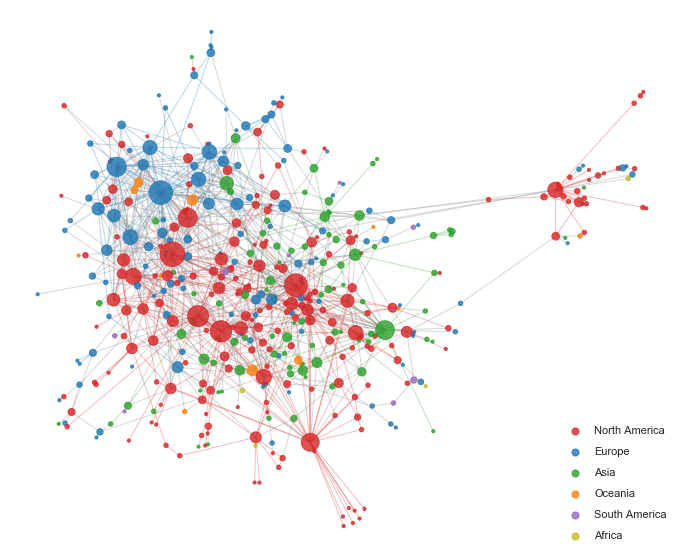

In [75]:
# create network with locations
location_G = nx.DiGraph()

location_G.add_nodes_from(location_df['user_name'].values)
pos_dict = dict(zip(location_df['user_name'].values, location_df['coordinates'].values))
nx.set_node_attributes(location_G, pos_dict,'pos')

for row in location_df.iterrows():
    edgelist = [(row[1]['user_name'], other_node) for other_node in row[1]['following_relevant_loc']]
    location_G.add_edges_from(edgelist)
    
WCC = max(nx.weakly_connected_components(location_G), key=len)
location_GCC = location_G.subgraph(WCC).to_undirected()
# scale node-size according to degree
d = dict(location_GCC.degree)
node_sizes = [v * 10 for v in d.values()]

positions = forceatlas2.forceatlas2_networkx_layout(location_GCC, pos=None, iterations=1000)

# color nodes according to location
continent_dict = dict(zip(location_df['user_name'].values, location_df['continent'].values))
nx.set_node_attributes(location_GCC, continent_dict,'continent')
colors = ['#d62728','#1f77b4','#2ca02c','#ff7f0e','#9467bd','#bcbd22']
node_colors = []
for node,continent in list(location_GCC.nodes('continent')):
    if continent == 'North America':
        node_colors.append(colors[0])
    elif continent == 'Europe':
        node_colors.append(colors[1])
    elif continent == 'Asia':
        node_colors.append(colors[2])
    elif continent == 'Oceania':
        node_colors.append(colors[3])
    elif continent == 'South America':
        node_colors.append(colors[4])
    elif continent == 'Africa':
        node_colors.append(colors[5])

# color edges according to between-continent or not
edge_colors = []
for edge in location_GCC.edges:
    if location_GCC.nodes[edge[0]]['continent'] != location_GCC.nodes[edge[1]]['continent']:
        edge_colors.append('#7f7f7f')
    else:
        continent = location_GCC.nodes[edge[0]]['continent']
        if continent == 'North America':
            edge_colors.append(colors[0])
        elif continent == 'Europe':
            edge_colors.append(colors[1])
        elif continent == 'Asia':
            edge_colors.append(colors[2])
        elif continent == 'Oceania':
            edge_colors.append(colors[3])
        elif continent == 'South America':
            edge_colors.append(colors[4])
        elif continent == 'Africa':
            edge_colors.append(colors[5])

# draw network
sns.set()

fig = plt.figure(figsize=(12,10))
nx.draw_networkx_nodes(location_GCC, positions, node_color=node_colors, alpha=0.8, node_size=node_sizes)
nx.draw_networkx_edges(location_GCC, positions, edge_color=edge_colors, alpha=0.3)

# labels
plt.scatter([], [], c=colors[0], alpha=0.8, s=50, label='North America')
plt.scatter([], [], c=colors[1], alpha=0.8, s=50, label='Europe')
plt.scatter([], [], c=colors[2], alpha=0.8, s=50, label='Asia')
plt.scatter([], [], c=colors[3], alpha=0.8, s=50, label='Oceania')
plt.scatter([], [], c=colors[4], alpha=0.8, s=50, label='South America')
plt.scatter([], [], c=colors[5], alpha=0.8, s=50, label='Africa')
plt.legend(scatterpoints=1, frameon=False, labelspacing=1)
plt.axis('off')
plt.show()

In [76]:
fig = plotly_graph(location_GCC,positions,'',False)
fig.write_html("visualizations/networkx_map.html")


In [77]:
fig = plotly_graph(location_GCC,positions,'',True)
fig.write_html("visualizations/plotly_map.html")
fig


So it can be seen from the map, that there are definitely some big hubs in North America both on the east coast, west coast and in the center defined by single very influantial users. There is also a hub in Europe mainly around Paris and smaller hub in Asia around Beijing. All of this also shows the power-law degree distribution of the network, where most nodes have only a few edges that are held together by a few highly connected hubs [http://networksciencebook.com/chapter/4#hubs]

However, there seems to be quite the connection accross borders. We therefore check number of connections across continents and compare it to the connections within borders.

In [78]:
# within
inside_continents = []
for edge in  location_GCC.edges:
    if location_GCC.nodes[edge[0]]['continent'] ==  location_GCC.nodes[edge[1]]['continent']:  
        
        l = location_GCC.nodes[edge[0]]['continent']
        inside_continents.append(l)
    
inside_df = pd.DataFrame()
inside_df['continents'] = np.unique(inside_continents,return_counts=True)[0]
inside_df['connections'] =np.unique(inside_continents,return_counts=True)[1]


# across
between_continents = []
inside_continents = []
for edge in  location_GCC.edges:
    if location_GCC.nodes[edge[0]]['continent'] !=  location_GCC.nodes[edge[1]]['continent']:  
        
        l = np.sort([location_GCC.nodes[edge[0]]['continent'],location_GCC.nodes[edge[1]]['continent']])
        between_continents.append('-'.join(l))
    
between_df = pd.DataFrame()
between_df['continents'] = np.unique(between_continents,return_counts=True)[0]
between_df['connections'] =np.unique(between_continents,return_counts=True)[1]

print('Across continents')
display(between_df.sort_values(by='connections',ascending=False))
print('Within continents')
display(inside_df.sort_values(by='connections',ascending=False))

Across continents


,continents,connections
6,Europe-North America,266
3,Asia-North America,165
2,Asia-Europe,48
7,Europe-Oceania,18
9,North America-Oceania,16
4,Asia-Oceania,9
10,North America-South America,9
1,Africa-North America,6
8,Europe-South America,4
0,Africa-Europe,2


Within continents


,continents,connections
2,North America,338
1,Europe,128
0,Asia,63
3,Oceania,3
4,South America,1


Here we see that most connections are made between the two main represented continents Europe and North America, which relates to what was expected from inspecting the map. Interestingly, there are mor connections between these continents than within Europe itself showing the dominance of North American users on github in regard to machine learning. The same applies for Asia where more connections are made between here and North America rather than within Asia itself. 

### 3.2.3 Sub-discussion

Overall, the main conclusions made from conducting spatiotemporal analysis, were that Python is by far the most domination programming language both today and over time likely due to its nature of being a general-purpose programming language. An increase in the usage of Jupyter Notebook was also found indicating the trend that users wish to ease the share of their work. This could be a reason for the decrease in usage of Java that is considered a bit more technical being a class-based, object-oriented programming language and thereby harder for others to comprehend and use. Since github is a platform seeking to inspire and ease the development and colloboration between users, this makes good sense. 


By inspecting the geographical location of the users and their connections, the purpose of github is also quite apparent having many connections across continents. From this analysis, it can also be seen that the most influential users are found in the big cities mainly in North America, however also in Europe and Asia. 


## 3.3 Community analysis

In this section, we seek to identify any communities within the github network and analyse each of them to infer differences and characteristics. Now we look at the entire network of 1585 users, hence when looking at the location, some nodes will now be given a grey color as belonging to the category *Other* indicating that their location is unknown. We decide to only analyze the top-5 largest communities. First just looking at the more simple features such as avg stars, forks and size as well as top represented continent. Lastly, a text analysis based on Term Frequency Inverse Document Frequency, TFIDF, looking into the dominating programming languages as well as most common words used in repository descriptions and biographies of users. This then ends in inspecting the sentiments for the communities. 

### 3.3.1 Community identification

To identify the communities within the network, we use the `community` module, that uses the *Louvain method* for community detection. This is a greedy optimization method that seeks to optimize the modularity of the network. Modularity measures the density of connections *inside* communities compared to connections *between* communities. The method consists of two steps. It starts by looking for the smaller communities by optimizing modularity locally. Then, it aggregates nodes belonging to the same community and builds a new network which nodes are the communities. These steps are then repeated until a maximum of modularity is found. We return the number of communities found and the distribution of the community sizes. 


In [79]:
# merge location dataframe to 'main' dataframe to get continents for users 
df = pd.merge(df, location_df[['user_name','continent']], how='left', on = ['user_name'])

Number of communities: 14.0

Actual size of each community:
[4, 4, 4, 16, 28, 30, 36, 37, 40, 79, 82, 102, 136, 139]

Bins:
[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150]


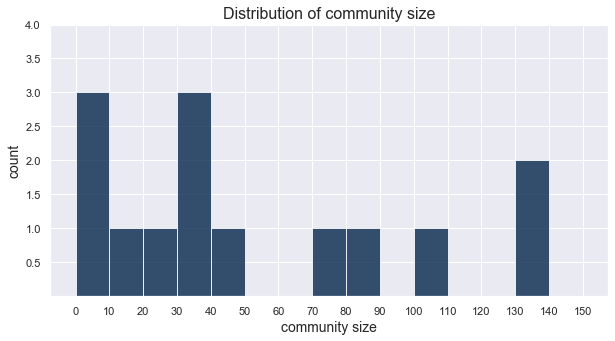

In [80]:
# get communities
partition = community.best_partition(giant, random_state=11)
size = float(len(set(partition.values())))
print(f'Number of communities: {size}')

# get communities and sizes
values = [val for val in partition.values()]
bins, counts = np.unique(values, return_counts=True)
print('\nActual size of each community:')
print(sorted(counts))

# define bins 0-10,10-20, 20-30 etc
bins_def = [x*10 for x in list(range(16))]

print('\nBins:')
print(bins_def)

# create histogram
sns.set()
plt.figure(figsize=(10, 5))
plt.hist(counts, color=blue[4], bins=bins_def, alpha=0.8)
plt.xticks(bins_def)
plt.yticks([0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4])
plt.xlabel('community size', fontsize=14)
plt.ylabel('count', fontsize=14)
plt.title('Distribution of community size', fontsize=16)
plt.show()

We choose to only look further into the 5 biggest communities and define a function to create the individual networks. 

In [81]:
top = np.argsort(counts)[-5:][::-1]
top_c = np.sort(counts)[-5:][::-1]
n_top = len(top)

In [82]:
def get_com(comnum):  
    com = [k for k,v in zip(partition.keys(), partition.values()) if v==comnum]   
    df_com1 = df[df['user_name'].isin(com)].reset_index(drop=True)
    
    # store the network of users with DiGraph
    G = nx.DiGraph()
    G.add_nodes_from(list(df_com1['user_name']))
    
    
    df_com1['following_relevant2'] = ''
    for i in range(len(df_com1)):
        try:
            df_com1['following_relevant2'].iloc[i] = np.unique([link for link in df_com1['following'][i] if link in df_com1['user_name'].values])
        except: 
            df_com1['following_relevant2'].iloc[i] = []
 

    for row in df_com1.iterrows():
        z = [(row[1]['user_name'], other_node) for other_node in row[1]['following_relevant2']]
        G.add_edges_from(z)
        

    # extract giant connected component 
    largest_cc = max(nx.weakly_connected_components(G), key=len)
    GCC = G.subgraph(largest_cc)
    giant = GCC.to_undirected()

    
    df_com1['in_degree'] = df_com1['user_name'].apply(lambda x: GCC.in_degree(x))
    df_com1['out_degree'] = df_com1['user_name'].apply(lambda x: GCC.out_degree(x))
    df_com1['degree'] = df_com1['user_name'].apply(lambda x: GCC.degree(x))
    
    
    return giant,df_com1

In [83]:
# make dataframe with communities, top users and languages

df_com = pd.DataFrame()
df_com['Number'] = top
df_com['Nodes'] = top_c

df_com['Sentiment_desc']=''
df_com['Sentiment_bio'] =''
df_com['Avg_stars'] = ''
df_com['Avg_LIX'] = ''

names = []
names2 = []
names3 = []

for i,t in enumerate(top):
    com_df = get_com(t)[1].reset_index(drop=True)
    
    langs = np.unique(list(com_df['main_language']),return_counts=True)[0]
    c_langs = np.unique(list(com_df['main_language']),return_counts=True)[1]
    name = langs[np.argsort(c_langs)[-3:]][::-1]
  
    names.append('-'.join(name)) # name communities        
    
    top3 = list(np.argsort(com_df['degree'])[-3:]) # get top three most connected characters
    name2 = [com_df['user_name'][idx] for idx in top3][::-1]
    connects = [com_df['degree'][idx] for idx in top3][::-1]   
  
    names2.append('-'.join(name2))
    
    cont = np.unique(list(com_df['continent']),return_counts=True)[0]
    c_cont = np.unique(list(com_df['continent']),return_counts=True)[1]
    name3 = cont[np.argsort(c_cont)[-3:]]
    name3 = name3[name3!='nan'][::-1]
  
    names3.append('-'.join(name3)) # name communities 
    
    df_com['Sentiment_desc'][i] = com_df['Sentiment_desc'].mean().round(2)
    df_com['Sentiment_bio'][i] = com_df['Sentiment_bio'].mean().round(2)
    df_com['Avg_stars'][i] = com_df['total_stars'].mean()
    df_com['Avg_LIX'][i] = com_df['lix_num'].mean()
    
      
df_com['Top_languages'] = names
df_com['Top_usernames'] = names2
df_com['Top_continents'] = names3


df_com = df_com.round(3)
#df_com.sort_values(by='Sentiment_desc',ascending=False).reset_index(drop=True)
print('The top variables are from left to right as top 1, 2, 3')
display(df_com)

The top variables are from left to right as top 1, 2, 3


,Number,Nodes,Sentiment_desc,Sentiment_bio,Avg_stars,Avg_LIX,Top_languages,Top_usernames,Top_continents
0,8,139,7.68,6.21,356.489,40.08,Python-C++-Go,gaocegege-yupbank-feihugis,North America-Asia
1,1,136,8.2,6.13,1658.09,41.1077,Python-Jupyter Notebook-JavaScript,ogrisel-amueller-agramfort,Europe-North America
2,6,102,8.18,6.16,2399.81,39.3299,Python-JavaScript-Jupyter Notebook,soumith-fchollet-ragavvenkatesan,North America-Asia
3,3,82,8.57,5.96,87.1585,34.2286,C#-Python-R,justinormont-sfilipi-kdcllc,North America-Europe
4,0,79,8.08,6.23,1432.95,38.9605,Python-Go-Jupyter Notebook,llSourcell-vmarkovtsev-chiphuyen,Europe-North America


For now, we can only describe the five largest communities such that four last ones are dominated by users in North America and the first in Europe. However the second and fourth community have second most users in Asia. Regarding programming language, we again see Python appearing in all communities, though the third is mainly described by using C# and here R us even mentioned, this is though also the community with the least average stars. The highest average stars is given to communities mainly using Python and Jupyter Notebook. 

### 3.3.2 Visualisation

Now, we go on to visualizing the communities and again use the `force2atlas` algorithm to determine the positions of the nodes. 

In [84]:
def graph_detail(comnum):
    giant2 = get_com(comnum)[0]
    loc_df = get_com(comnum)[1]
    positions = forceatlas2.forceatlas2_networkx_layout(giant2, pos=None, iterations=5) 

    # color nodes according to location
    continent_dict = dict(zip(loc_df['user_name'].values, loc_df['continent'].values))
    nx.set_node_attributes(giant2, continent_dict,'continent')
  
    colors = ['#d62728','#1f77b4','#2ca02c','#ff7f0e','#9467bd','#bcbd22','#7f7f7f']
    node_colors = []
    for node,continent in list(giant2.nodes('continent')):
        if continent == 'North America':
            node_colors.append(colors[0])
        elif continent == 'Europe':
            node_colors.append(colors[1])
        elif continent == 'Asia':
            node_colors.append(colors[2])
        elif continent == 'Oceania':
            node_colors.append(colors[3])
        elif continent == 'South America':
            node_colors.append(colors[4])
        elif continent == 'Africa':
            node_colors.append(colors[5])
        else:
            node_colors.append(colors[6])

    # color edges according to between-continent or not
    edge_colors = []
    for edge in giant2.edges:
        try:
            if giant2.nodes[edge[0]]['continent'] != giant2.nodes[edge[1]]['continent']:
                edge_colors.append(colors[6])
            else:
                continent = giant2.nodes[edge[0]]['continent']
                if continent == 'North America':
                    edge_colors.append(colors[0])
                elif continent == 'Europe':
                    edge_colors.append(colors[1])
                elif continent == 'Asia':
                    edge_colors.append(colors[2])
                elif continent == 'Oceania':
                    edge_colors.append(colors[3])
                elif continent == 'South America':
                    edge_colors.append(colors[4])
                elif continent == 'Africa':
                    edge_colors.append(colors[5])
        except:
            edge_colors.append(colors[6])
            
    
    d = dict(giant2.degree)
    sizes = [v *10 for v in d.values()]
    
    return giant2, positions,sizes, node_colors, edge_colors

In [85]:
graphs_list = []
positions_list = []
sizes_list =[]
node_cols = []
edge_cols = []

for t in top:    
    g1 = graph_detail(t)[0]
    pos1 = graph_detail(t)[1]
    size1 =  graph_detail(t)[2]
    nodecol1 =  graph_detail(t)[3]
    edgecol1 =  graph_detail(t)[4]
  
    graphs_list.append(g1)
    positions_list.append(pos1)
    sizes_list.append(size1)
    node_cols.append(nodecol1)
    edge_cols.append(edgecol1)


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 716.24it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 557.46it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 626.78it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 455.79it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 455.73it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 557.04it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 417.77it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 716.31it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 716.24it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 716.26it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 716.53it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 716.24it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 716.24it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 1004.24it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 833.06it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds
BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 1002.89it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds
BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 1253.53it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 417.81it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.01  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 557.28it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 1671.97it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 556.94it/s]


BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


100%|██████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 1672.24it/s]

BarnesHut Approximation  took  0.00  seconds
Repulsion forces  took  0.00  seconds
Gravitational forces  took  0.00  seconds
Attraction forces  took  0.00  seconds
AdjustSpeedAndApplyForces step  took  0.00  seconds


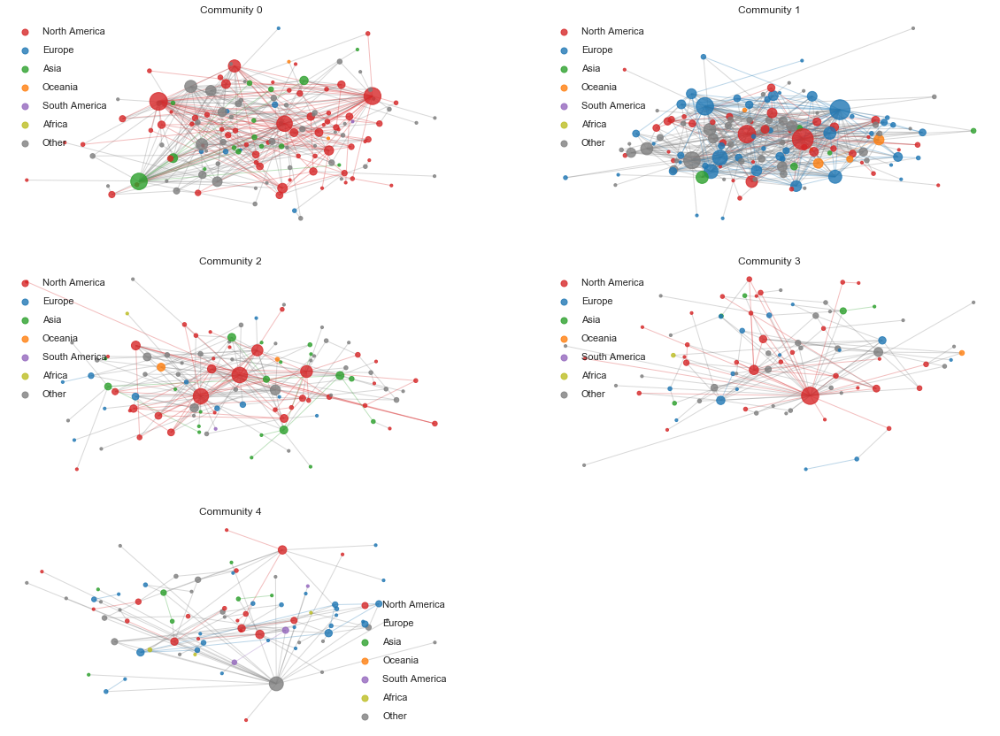

In [86]:
# set style, figure size and title
sns.set()

plt.figure(figsize=(20,20))
colors = ['#d62728','#1f77b4','#2ca02c','#ff7f0e','#9467bd','#bcbd22','#7f7f7f']

for i in range(n_top):
    
    comnum=i
    
    plt.subplot(4,2,i+1)
     
    # set style, figure size and axis off
 #   jtplot.style('chesterish')
 

    # draw network
    nx.draw_networkx_nodes(graphs_list[comnum], positions_list[comnum], node_color=node_cols[comnum], alpha=0.8, node_size=sizes_list[comnum])
    nx.draw_networkx_edges(graphs_list[comnum], positions_list[comnum], edge_color=edge_cols[comnum], alpha=0.3)
   # plt.scatter([], [], c=blue[5], alpha=0.9, s=100, label='Github users')

    # labels
    plt.scatter([], [], c=colors[0], alpha=0.8, s=50, label='North America')
    plt.scatter([], [], c=colors[1], alpha=0.8, s=50, label='Europe')
    plt.scatter([], [], c=colors[2], alpha=0.8, s=50, label='Asia')
    plt.scatter([], [], c=colors[3], alpha=0.8, s=50, label='Oceania')
    plt.scatter([], [], c=colors[4], alpha=0.8, s=50, label='South America')
    plt.scatter([], [], c=colors[5], alpha=0.8, s=50, label='Africa')
    plt.scatter([], [], c=colors[6], alpha=0.8, s=50, label='Other')
    plt.legend(scatterpoints=1, frameon=False, labelspacing=1)

    
   # plt.legend(scatterpoints=1, frameon=False, labelspacing=1)
    plt.axis('off')
    plt.title(f'Community {i}')

plt.show()

Looking at the networks, it becomes clear that there are quite a few users that do not have a location attached to them. However, there is still patterns regarding continent seeing that North America is dominant in the first and fourth community, whereas 

In [87]:
for i in range(n_top):
    fig_com = plotly_graph(graphs_list[i],positions_list[i],'',False)
    fig_com.write_html(f"visualizations/file{i}.html")


### 3.3.3 Text analysis

In this part, we analyze the importance of words in each community using TF-IDF, a statistic used to reflect the importance of a word in one document in a collection of documents. In this case, a document refers to the collection of text in either  all descriptions, biographies or languages for the users in each community. TF-IDF is relevant here since we have a corpus of five documents to look at for each of the different text categories.  There are different ways of calculating the measure, though mostly refering to the IDF part, i.e. the inverse document frequency, that shows how much information a word provides in terms of it being common or rare across all documents. 

We use the raw count for the term frequency, TF, and the smooth version of the IDF, adding 1 in the denominator. 

$$TFIDF(i,j) = TF(i,j) \cdot IDF(i) = TF(i,j) \cdot log(\frac{N}{DF(i)+1})$$

where: 

$TF(i,j):$ Frequency of term $i$ in document $j$

$DF(i)$: Number of documents containing term $i$

$N$ : Number of documents



In [88]:
def TF_IDF(col,cat):
    
    if cat=='community':
    # get tokens and TFs for each community
        tokens = [list(get_TF(get_com(i)[1],col)[0].keys())for i in range(n_top)]
        TFs = [list(get_TF(get_com(i)[1],col)[0].values()) for i in range(n_top)]

        # define documents
        Docs = [f'Doc{i}' for i in range(n_top)]

    elif cat=='years':
        tokens = [list(get_TF(get_year([y])[0],col)[0].keys())for y in years]
        TFs = [list(get_TF(get_year([y])[0],col)[0].values()) for y in years]

        # define documents
        Docs = [f'Doc{i}' for i in range(len(years))]


    DF = pd.DataFrame()

    for i in range(n_top):
        DF1 = pd.DataFrame()
        DF1['Words'] = tokens[i]
        DF1[Docs[i]] = TFs[i]    
        DF = pd.concat([DF,DF1])

    DF_group = DF.groupby(['Words']).sum().reset_index()
    DF_group.replace(0, np.nan, inplace=True)

    # find document frequncy for each word
    DF_group['DF'] = DF_group[DF_group.columns[1:]].count(axis=1)

    # then calculate IDF
    DF_group['IDF'] = [np.log(n_top)/(nt+1)+1 for nt in DF_group['DF']]

    # lastly calculate TF-IDF for each word in each document
    for i in range(n_top):
        DF_group[f'{Docs[i]}_TFIDF'] = DF_group[Docs[i]]*DF_group['IDF']

    return DF_group

In [89]:
def create_wordcloud(num,col,cat):
    
    DF_group = TF_IDF(col,cat)
    Com = DF_group[~DF_group[f'Doc{num}_TFIDF'].isna()][['Words',f'Doc{num}_TFIDF']].reset_index()  
    
    
    Freq = dict(zip(Com['Words'],Com[f'Doc{num}_TFIDF']))
    
    try:
        Freq.pop('machine')
        Freq.pop('learning')
    except:
        None

    numnum = top[num]   
    com_df = get_com(numnum)[1].reset_index(drop=True)


    # create WordCloud
    wordcloud = WordCloud(background_color="#D3D3D3", max_words=2000, max_font_size=256, color_func=one_color_func)
    wordcloud.generate_from_frequencies(Freq)

    img = plt.imshow(wordcloud, interpolation='bilinear') 
 

Community 1


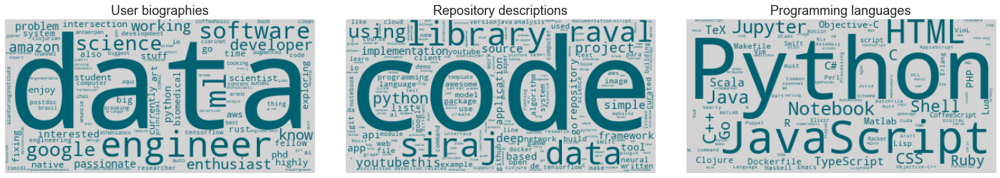

Community 2


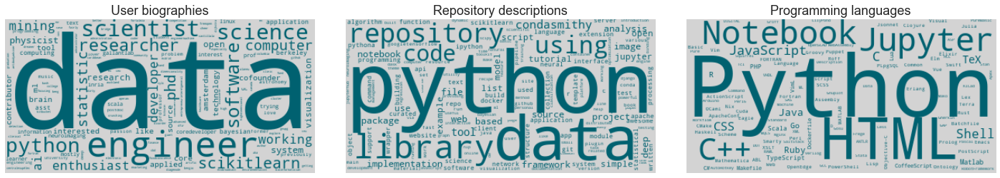

Community 3


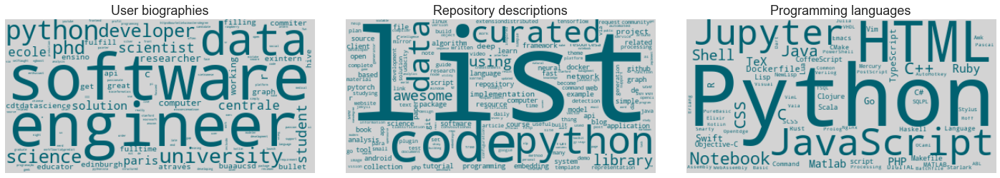

Community 4


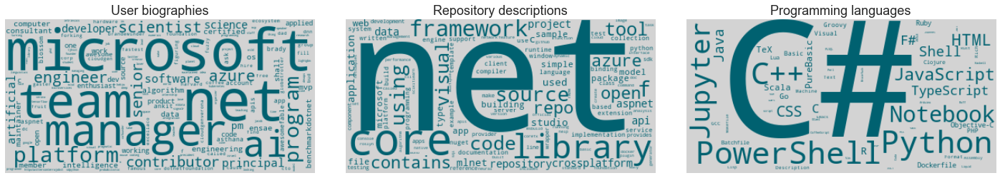

Community 5


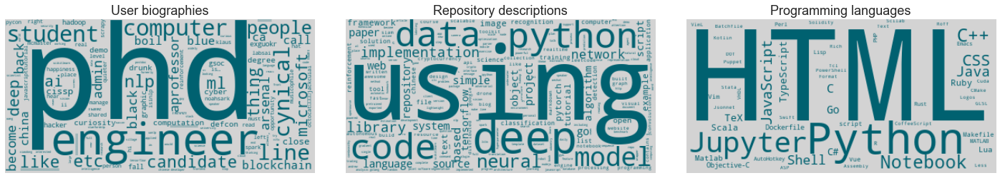

<Figure size 432x288 with 0 Axes>

In [98]:
sns.set()
#plt.figure(figsize=(20,40))
# create subplots
for i in range(n_top):
    print(f'Community {i+1}')
    plt.figure(figsize=(20,10))
    #plt.subplot(n_top,3,(i*3)+1)
  
     #fig1 =plt.figure(figsize=(10,5))
    plt.subplot(3,3,1)
    create_wordcloud(i,cols[0],'community') 
    plt.axis("off")
     #fig1.savefig(f'visualizations/{titles[0]}_word{i}.png', bbox_inches='tight', pad_inches=0)
    plt.title(titles[0],fontsize=18)
  #  plt.subplot(n_top,3,(i*3)+2) 

      #fig2 =plt.figure(figsize=(10,5))
    plt.subplot(3,3,2)
    create_wordcloud(i,cols[1],'community')
    plt.axis("off")
    #fig2.savefig(f'visualizations/{titles[1]}_word{i}.png', bbox_inches='tight', pad_inches=0)
    plt.title(titles[1],fontsize=18)
  #  plt.subplot(n_top,3,(i*3)+3)  
    #fig3 =plt.figure(figsize=(10,5))
    plt.subplot(3,3,3)
    create_wordcloud(i,cols[2],'community')
    plt.axis('off')
    #fig3.savefig(f'visualizations/{titles[2]}_word{i}.png', bbox_inches='tight', pad_inches=0)
    
    plt.title(titles[2],fontsize=18)
    plt.savefig(f'visualizations/word{i}.png')
    plt.tight_layout()
    plt.show()
    
plt.tight_layout()
plt.show()

By inspecting the wordclouds, we see some characterics for the communities. In the first community, we now see a dominance of HTML as well, and we see words as scientist, reseacher and engineer in the biographies. For the second community, we see a dominance of C++ and words such as university, majored, passionate,  national and student indicating this is more of a community of users in an educational enviroment. In the fourth community, we see dominance of words as AI, phd, design and university in the biograhies as well as deep learning and network in the descriptions. The last community also stands out by languages such as C# and even PowerShell as dominant. Looking at the biographies with words as manager, microsoft, team and platform is seems these users are more connected to the industry. 


From here we continue to look at the lix number within the communities as well as sentiments for the descriptions and biographies.

In [149]:
def highlight_col(x):
    r = 'background-color: #d3d3d3'
    df1 = pd.DataFrame('', index=x.index, columns=x.columns)
    df1.iloc[:, 0] = r
    return df1    


In [151]:
print('Sorted by lix number')

df1 = df_com.sort_values(by=['Avg_LIX'],ascending=False)[df_com.columns[2:]][['Avg_LIX','Sentiment_bio', 'Sentiment_desc', 'Avg_stars',
        'Top_languages', 'Top_usernames', 'Top_continents']]

display(df1.style.apply(highlight_col, axis=None))
    


Sorted by lix number


,Avg_LIX,Sentiment_bio,Sentiment_desc,Avg_stars,Top_languages,Top_usernames,Top_continents
1,41.107692,6.130000,8.200000,1658.088235,Python-Jupyter Notebook-JavaScript,ogrisel-amueller-agramfort,Europe-North America
0,40.080000,6.210000,7.680000,356.489209,Python-C++-Go,gaocegege-yupbank-feihugis,North America-Asia
2,39.329897,6.160000,8.180000,2399.813725,Python-JavaScript-Jupyter Notebook,soumith-fchollet-ragavvenkatesan,North America-Asia
4,38.960526,6.230000,8.080000,1432.949367,Python-Go-Jupyter Notebook,llSourcell-vmarkovtsev-chiphuyen,Europe-North America
3,34.228571,5.960000,8.570000,87.158537,C#-Python-R,justinormont-sfilipi-kdcllc,North America-Europe


In [153]:
print('Sorted by sentiments in repository descriptions')

df2 =df_com.sort_values(by=['Sentiment_desc'],ascending=False)[df_com.columns[2:]][['Sentiment_desc', 'Sentiment_bio', 'Avg_stars',
       'Avg_LIX', 'Top_languages', 'Top_usernames', 'Top_continents']]

display(df2.style.apply(highlight_col, axis=None))
    


Sorted by sentiments in repository descriptions


,Sentiment_desc,Sentiment_bio,Avg_stars,Avg_LIX,Top_languages,Top_usernames,Top_continents
3,8.570000,5.960000,87.158537,34.228571,C#-Python-R,justinormont-sfilipi-kdcllc,North America-Europe
1,8.200000,6.130000,1658.088235,41.107692,Python-Jupyter Notebook-JavaScript,ogrisel-amueller-agramfort,Europe-North America
2,8.180000,6.160000,2399.813725,39.329897,Python-JavaScript-Jupyter Notebook,soumith-fchollet-ragavvenkatesan,North America-Asia
4,8.080000,6.230000,1432.949367,38.960526,Python-Go-Jupyter Notebook,llSourcell-vmarkovtsev-chiphuyen,Europe-North America
0,7.680000,6.210000,356.489209,40.080000,Python-C++-Go,gaocegege-yupbank-feihugis,North America-Asia


In [155]:
print('Sorted by sentiments in user biograhies')
    
df3 = df_com.sort_values(by=['Sentiment_bio'],ascending=False)[df_com.columns[2:]][['Sentiment_bio', 'Sentiment_desc', 'Avg_stars',
       'Avg_LIX', 'Top_languages', 'Top_usernames', 'Top_continents']]
display(df3.style.apply(highlight_col, axis=None))
    



Sorted by sentiments in user biograhies


,Sentiment_bio,Sentiment_desc,Avg_stars,Avg_LIX,Top_languages,Top_usernames,Top_continents
4,6.230000,8.080000,1432.949367,38.960526,Python-Go-Jupyter Notebook,llSourcell-vmarkovtsev-chiphuyen,Europe-North America
0,6.210000,7.680000,356.489209,40.080000,Python-C++-Go,gaocegege-yupbank-feihugis,North America-Asia
2,6.160000,8.180000,2399.813725,39.329897,Python-JavaScript-Jupyter Notebook,soumith-fchollet-ragavvenkatesan,North America-Asia
1,6.130000,8.200000,1658.088235,41.107692,Python-Jupyter Notebook-JavaScript,ogrisel-amueller-agramfort,Europe-North America
3,5.960000,8.570000,87.158537,34.228571,C#-Python-R,justinormont-sfilipi-kdcllc,North America-Europe


The sentiments are not that different, though the biggest European network is the happiest both in biographies and descriptions. 

### 3.3.4 Sub-discussion

The main findings in the community analysis was that Python is again the most dominant programming language and the communities of users also using Jupyter Notebook are those with most stars on average. One community is dominated by Asian users, two are of European users and two of North American users.  By looking at the wordclouds, it was seen that some communities mostly relates to the educuational area with words as university and student, whereas the fifth community relates more to the industry with words as manager, principal and developer. The sentiment analysis did no show any clear patterns in regard to vibe in the communities. 


# 4 Discussion
*Think critically about creation. What went well? What is still missing? What could be improved?, Why?*

# 5 Contributions


In [94]:
ct = pd.DataFrame({'Section 1' : ["", "", "", "", "", "", "", "", ""], 
                   'Section 2' : ["", "", "", "", "", "", "", "", ""],
                   'Section 3' : ["", "", "", "", "", "", "", "", ""],
                   'Section 4' : ["", "", "", "", "", "", "", "", ""]}, 
                   index =['Part 1','Part 2.1','Part 2.2','Part 3.1','Part 3.2','Part 3.3','Part 3.4','Part 3.5','Part 4']) 
ct

,Section 1,Section 2,Section 3,Section 4
Part 1,,,,
Part 2.1,,,,
Part 2.2,,,,
Part 3.1,,,,
Part 3.2,,,,
Part 3.3,,,,
Part 3.4,,,,
Part 3.5,,,,
Part 4,,,,
